$\Huge \rm MDS7201$


$\Huge \rm Exploratory~ Data~ Analysis~ (EDA)$

Francisco Förster

# The problem

* What is the problem you want to solve?

* What are the KPIs? SMART vs FAST

## SMART:

![smart](smart.png)

## FAST:

![fast](FAST.jpg)

## Preliminary Analysis

* What data and how much data is available?

* Any missing values?

* Basic statistics

* What preprocessing is required? Can you scale the data to make it look normal?

* Can you add new sources of data?

* Can you visualize the data?

* Can you solve the problem just looking at the data?

## Detailed analysis

* Are the variables independent? If not, what are the correlations?

* Do you need to reduce the dimensionality of the data?

* Can you do unsupervised clustering?

* Is there a data imbalance problem? If so, can you fix it? (if supervised)

* If classification or regression, plot the variables divided by class or range of variable to predict.

* Do KS test to automatically identify the variables that are more relevant.

* Perform feature importance tests, e.g. training a random forest

# What should a good exploratory data analysis contain?

From chatGPT4o: 

A good Exploratory Data Analysis (EDA) should provide a comprehensive understanding of the dataset, identify potential issues, and extract initial insights. Below are the key components of an effective EDA:

## Understanding the Data

- Dataset Overview: Brief description of the dataset, including its source, structure, and purpose.
- Column Descriptions: List of variables (features), their types (categorical, numerical, etc.), and meanings.
- Shape of Data: Number of rows and columns.

## Handling Missing Data

- Check for missing values in each column.
- Assess patterns of missingness (random, systematic, or correlated with other features).
- Decide on imputation strategies (mean, median, mode, interpolation, or removal of rows/columns).

## Handling Duplicates

- Identify and remove duplicate rows if they are redundant.

## Basic Descriptive Statistics

- Summary statistics for numerical variables (mean, median, variance, skewness, kurtosis, etc.).
- Summary of categorical variables (frequency counts, mode, unique values).

## Feature Distributions

- Histograms & KDE plots: Show how numerical variables are distributed.
- Boxplots: Identify outliers and spread of the data.
- Bar plots: Visualize categorical variable distributions.

## Outlier Detection

- Boxplots, Z-scores, or Interquartile Range (IQR) method.
- Impact assessment: Are outliers errors or meaningful?

## Feature Relationships and Correlations

- Pairwise scatter plots (pairplot): Identify relationships between numerical variables.
- Correlation matrix (heatmap): Identify collinear features.
- Categorical vs. numerical relationships: Boxplots, violin plots.
- Time-series trends (if applicable).

## Feature Engineering Insights

- Identify potential transformations (log, scaling, etc.).
- Suggest new features based on interactions or domain knowledge.
- Encoding strategies for categorical variables.

## Data Quality and Anomalies

- Check for inconsistencies, incorrect values, or unexpected patterns.
- Verify data types and potential formatting issues.

## Initial Hypothesis and Insights

- Based on the patterns observed, outline possible trends and relationships.
- Formulate hypotheses for further testing or modeling.

## Bonus: Automation & Reproducibility

- Use Jupyter Notebooks or Python scripts for reproducibility.
- Leverage EDA libraries like pandas-profiling, sweetviz, or dataprep.

# What Should a Good Exploratory Data Analysis Contain?

From Claude Opus 4.6# What Should a Good Exploratory Data Analysis Contain?

# What Should a Good Exploratory Data Analysis Contain?

## 1. Problem and Measurement Framing

- What question are you trying to answer? State the prediction target or the analytical objective explicitly before touching the data.
- What do the observations represent? Define the unit of analysis (a customer, a transaction, a sensor reading, a product).
- What is the data collection or sampling mechanism? Understanding how data was generated is prerequisite to interpreting it — a survey, a sensor network, a web log, and a database export each introduce different biases.
- What time period or geographic scope does the data cover? Are there known gaps or selection effects?
- What domain knowledge is relevant? Identify features whose meaning requires expertise to interpret correctly, and document that interpretation before computing statistics.
- What are the known limitations or caveats of the dataset communicated by whoever produced it?

## 2. Automated Overview

- Use an automated profiling tool (e.g., `ydata-profiling`, `sweetviz`) as a first pass to get a rapid, broad summary. Treat this as a baseline, not a conclusion.
- Check the shape of the data: number of rows (samples), number of columns (features), and data types.
- Verify that data types are correct — a categorical variable encoded as integer, or a float column that should be boolean, will silently corrupt downstream analyses.
- Check for duplicate rows. Are they genuine repeated measurements or data ingestion errors?
- Identify constant or near-constant columns. These carry no information and should be flagged.

## 3. Missing Data Analysis

- Compute the fraction of missing values per column and per row.
- Diagnose the *mechanism* of missingness:
  - **MCAR** (Missing Completely At Random): missingness is unrelated to any variable. Safe to impute or drop.
  - **MAR** (Missing At Random): missingness depends on other observed variables. Imputation is valid if conditioned on the right variables.
  - **MNAR** (Missing Not At Random): missingness depends on the unobserved value itself (e.g., a sensor that fails precisely when readings exceed its range). Imputation is epistemically questionable and can introduce bias.
- Visualise missingness patterns — are missing values correlated across features? A missingness heatmap or matrix plot can reveal systematic structure.
- Distinguish true missing values from sentinel values (e.g., −999, −0.005, "N/A" encoded as a number). Sentinels are not missing at random; they carry information and must be treated explicitly.
- Document the imputation strategy chosen (mean, median, KNN, model-based) and its justification. Note that imputation should generally be applied *after* any variance-stabilising transformations, and *fitted on the training set only* in a supervised context.

## 4. Single-Variable Distributions

- For each **continuous variable**: plot a histogram and/or KDE; compute mean, median, standard deviation, skewness, and kurtosis.
- For each **discrete or count variable**: use a bar plot or value counts; check for unexpected concentrations at specific values.
- For each **categorical variable**: tabulate frequencies; identify rare categories that may need grouping or special treatment.
- Identify outliers using boxplots, Z-scores, or IQR. Critically assess each outlier: is it a measurement error, a data entry error, or a genuine extreme observation that should be retained?
- Note asymmetric distributions that may cause problems for models that assume normality or equal variance.

## 5. Variable Transformations

- For skewed continuous variables, consider log, square root, or power transforms to bring the distribution closer to Gaussian.
- Apply normality tests (e.g., Shapiro-Wilk for small samples, Anderson-Darling or D'Agostino-Pearson for large samples) to assess the effect of transformations quantitatively.
- Use `PowerTransformer` (Box-Cox for strictly positive data, Yeo-Johnson for arbitrary-sign data) as a principled, automated approach to variance stabilisation.
- Standardise (zero mean, unit variance) after transformation if the model or distance metric is scale-sensitive.
- Fit all transformers on the training set only and apply to the validation/test set. Fitting on the full dataset is a form of data leakage.
- Document every transformation applied so that the pipeline can be reproduced and inverted if necessary.

## 6. Bivariate and Multivariate Structure

- Compute a pairwise correlation matrix (Pearson for approximately normal variables, Spearman for ordinal or non-normal variables). Visualise as a heatmap.
- Identify highly correlated feature pairs (|r| > 0.9 as a rough threshold). Collinear features can destabilise linear models and distort importance estimates.
- For key feature pairs, plot scatter plots or 2D density plots rather than relying solely on the correlation coefficient, which cannot detect nonlinear relationships.
- For categorical vs. continuous relationships, use boxplots or violin plots stratified by category.
- For very large datasets, use density-based visualisation tools (e.g., datashader) to avoid overplotting.

## 7. Dimensionality and Redundancy

- Apply PCA and plot the explained variance ratio as a function of the number of components. How many components are needed to retain 90% or 95% of variance? This quantifies effective dimensionality.
- Apply agglomerative or hierarchical clustering to the feature correlation matrix to identify groups of features that measure similar underlying phenomena. This can inform deliberate feature selection or averaging.
- Apply nonlinear dimensionality reduction (e.g., UMAP, t-SNE) to visualise the global structure of the data in 2D. Note that these methods have hyperparameters (`n_neighbors`, `min_dist` for UMAP) that strongly influence the result; explore more than one setting.
- Distinguish dimensionality reduction for *visualisation* from dimensionality reduction for *modelling*. The former prioritises structure preservation; the latter prioritises downstream predictive performance.

## 8. Label-Stratified Analysis (Supervised Setting)

- Tabulate the class distribution. Is there a class imbalance? If so, quantify its severity (ratio of majority to minority class).
- For each feature, plot its distribution stratified by class. Overlapping histograms or violin plots per class reveal discriminative power directly.
- Apply the Kolmogorov-Smirnov (KS) test or similar two-sample test to rank features by how differently they are distributed across classes. Correct for multiple comparisons (Bonferroni, Benjamini-Hochberg) — with many features, naive p-value thresholding will yield many false positives.
- Check whether class membership is correlated with missingness. If missing values are concentrated in one class, imputation will effectively encode class information.
- Consider whether the class definition is stable and unambiguous. Ambiguous or noisy labels will ceiling the achievable performance regardless of modelling choices.

## 9. Feature Relevance

- Train a simple model (e.g., a shallow random forest or gradient boosting tree) and extract feature importances as a data-driven ranking of variables.
- Be aware that **impurity-based importances** (default in scikit-learn's `RandomForestClassifier`) are biased toward high-cardinality and correlated features. Prefer **permutation importances** when correlated features are present.
- Cross-reference model-based importances with the univariate statistical results from the previous section. Agreement increases confidence; disagreement is informative and worth investigating.
- Use feature importances to inform, not dictate, feature selection. Domain knowledge should override a purely data-driven ranking when there is good reason.

## 10. Data Quality and Anomalies

- Check for inconsistencies between related variables (e.g., a count feature that is negative, a fraction that exceeds 1, a ratio whose numerator exceeds its denominator).
- Look for unexpected value ranges. Even if a value is not a statistical outlier, it may be physically or logically impossible given the domain.
- Check for **data leakage**: does any feature encode information that would not be available at prediction time in a real deployment? This is the most dangerous form of data quality problem because it inflates performance estimates without being detectable from the data alone — it requires domain reasoning.
- Verify that the index or identifier column is genuinely unique and that joins, pivots, or reshaping operations did not inadvertently duplicate or drop rows.

## 11. Synthesis and Decisions

- Summarise the key findings: what did you learn about the data that was not obvious from its description alone?
- State the preprocessing decisions that are implied by the analysis: which features to drop, which to transform, which imputation strategy to use, whether to address class imbalance and how.
- Identify the open questions that EDA could not answer and that will require modelling experiments to resolve.
- Document everything. An EDA that cannot be reproduced is not an analysis — it is a collection of observations.

# Example dataset

We will use some data from the ALeRCE broker. This consists of features obtained from time series in two different bands. Some features cannot be computed, so they have NaN values.

The focus of this class will be *tabular* data, note that images, time series, text all have different techniques associated.

Let's try some real data from the ALeRCE broker. This data contains features for different astronomical objects. The object name is `oid`, the feature name is `name`, the band used to derive the feature is `fid`, the value of the feature is `value`, and the version of the computed feature is `version`.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
df = pd.read_pickle("data/features_small.pickle")

In [3]:
df

,name,value,fid,version
oid,,,,
ZTF17aaaabrg,Amplitude,0.242504,1,feature_0.0.1
ZTF17aaaabrg,Amplitude,0.232499,2,feature_0.0.1
ZTF17aaaabrg,AndersonDarling,1.000000,1,feature_0.0.1
ZTF17aaaabrg,AndersonDarling,1.000000,2,feature_0.0.1
ZTF17aaaabrg,Autocor_length,1.000000,1,feature_0.0.1
...,...,...,...,...
ZTF21abkylyc,Std,0.239856,2,feature_0.0.1
ZTF21abkylyc,StetsonK,NaN,1,feature_0.0.1
ZTF21abkylyc,StetsonK,0.886870,2,feature_0.0.1


Let's reset the index, create a new column with the name and fid, and pivot the data

In [4]:
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df

,oid,name,value,fid,version,fname
0,ZTF17aaaabrg,Amplitude,0.242504,1,feature_0.0.1,Amplitude_1
1,ZTF17aaaabrg,Amplitude,0.232499,2,feature_0.0.1,Amplitude_2
2,ZTF17aaaabrg,AndersonDarling,1.000000,1,feature_0.0.1,AndersonDarling_1
3,ZTF17aaaabrg,AndersonDarling,1.000000,2,feature_0.0.1,AndersonDarling_2
4,ZTF17aaaabrg,Autocor_length,1.000000,1,feature_0.0.1,Autocor_length_1
...,...,...,...,...,...,...
6739895,ZTF21abkylyc,Std,0.239856,2,feature_0.0.1,Std_2
6739896,ZTF21abkylyc,StetsonK,NaN,1,feature_0.0.1,StetsonK_1
6739897,ZTF21abkylyc,StetsonK,0.886870,2,feature_0.0.1,StetsonK_2
6739898,ZTF21abkylyc,W1-W2,NaN,0,feature_0.0.1,W1-W2_0


Let's pivot the data to have one row per object


In [5]:
df = df.pivot(index="oid", columns=["fname"], values="value")
df.head()

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.0,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.0,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.0,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.0,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.0,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625


In [6]:
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,NaN,0.677959,NaN,1.0,NaN,0.333333,NaN,0.0,NaN,...,0.0,NaN,6.0,NaN,1.000000,NaN,NaN,NaN,0.725000,0.979375
ZTF21abkndcw,0.617332,NaN,0.989514,NaN,1.0,NaN,0.166667,NaN,0.0,NaN,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


Now we have one row per object and one column per feature per band

We will now work with a sample of 1000 rows to speed up some computations

In [7]:
df = df.sample(1000, random_state=42)

# Automatic EDA (not recommended)

In [8]:
from ydata_profiling import ProfileReport

First, we do a minimal analysis for all the columns

In [9]:
profile = ProfileReport(df, minimal=True)
profile.to_file(output_file="output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 179/179 [00:00<00:00, 250.34it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Then, we run a full analysis for the first 15 columns

In [10]:
profile = ProfileReport(df.iloc[:, :15])
profile.to_file(output_file="output_selection.html")

/home/fforster/anaconda3/lib/python3.13/site-packages/ydata_profiling/utils/dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 535.94it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing

## Data cleaning


* Missing data
* Noisy data
* Incorrect typing

### Missing data

Let's count the fraction of nan values

<Axes: ylabel='fname'>

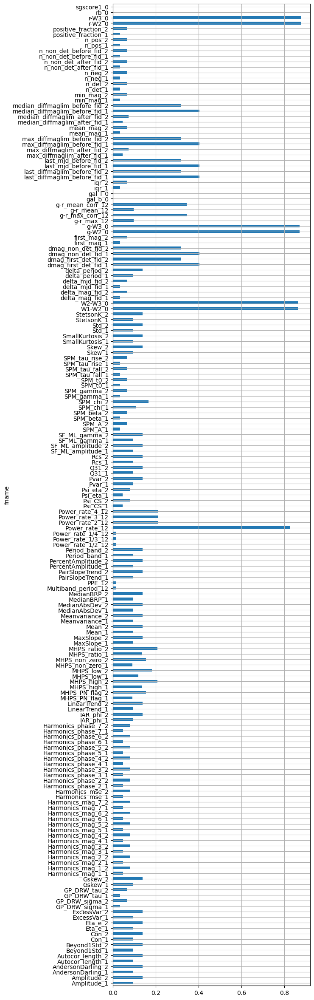

In [8]:
(df.isna().sum() / df.shape[0]).plot.barh(figsize=(6, 30), grid=True)

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

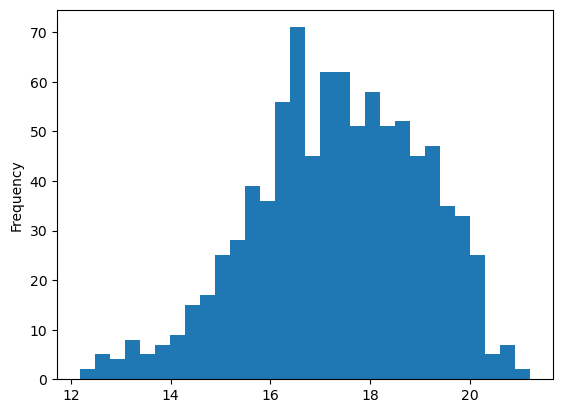

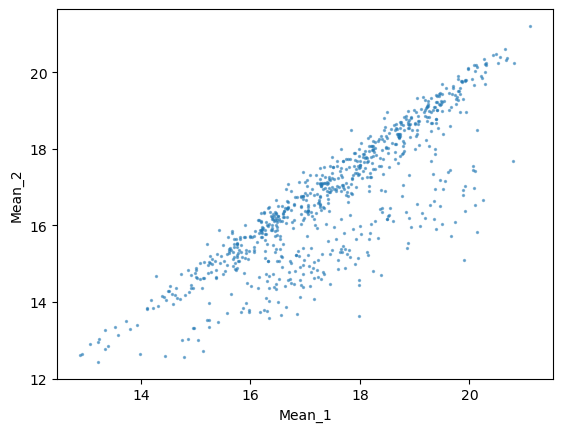

In [9]:
df.Mean_1.plot.hist(bins=30)
df.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

Visualize with datashader if you want to have interactive visualization

In [10]:
#import datashader as ds
#import holoviews as hv
#
#from holoviews import opts
#from holoviews.operation.datashader import datashade, rasterize, shade, dynspread, spread
#from holoviews.operation.resample import ResampleOperation2D
#from holoviews.operation import decimate
#
#from matplotlib import colormaps as cmap

In [11]:
#hv.extension('bokeh', 'matplotlib', width=80)

In [12]:
#cmap["viridis"]

In [13]:
#points = datashade(hv.Points(df[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

### Types of missingness

**MCAR — Missing Completely At Random**

The probability of missingness is independent of both the observed and the unobserved data:

$\Huge P(R | Y_{obs}, Y_{mis}) = P(R)$

where R is the missingness indicator. This is the strongest assumption and rarely holds in practice. When it does, the complete cases are a simple random subsample of the full dataset — no bias is introduced by listwise deletion, though you lose efficiency. Imputation is valid but also unnecessary for unbiased inference (though still useful for power).

A key diagnostic: if you can predict missingness from your observed variables, you have already falsified MCAR.

**MAR — Missing At Random**

The probability of missingness depends only on the observed data, not on the missing values themselves:

$\Huge P(R | Y_{obs}, Y_{mis}) = P(R | Y_{obs})$

This is a fundamentally untestable assumption — you cannot distinguish MAR from MNAR using the data alone, because the very values that would distinguish them are missing. This is critical and often glossed over.

"At Random" is a misleading name: it does not mean missingness is random, only that it is explainable by what you have observed. A spectrograph that preferentially fails for faint objects is not MAR unless apparent magnitude is in your dataset and you condition on it.
Multiple imputation and likelihood-based methods (e.g., EM algorithm) are valid under MAR, but only if the variables driving missingness are included in the imputation model. Omitting them does not make the assumption go away — it makes it wrong.

**MNAR — Missing Not At Random**
    
The probability of missingness depends on the unobserved value itself, even after conditioning on all observed data:

$\Huge P(R | Y_{obs}, Y_{mis}) ≠ P(R | Y_{obs})$

This is the realistic case for many physical instruments, which is why it deserves particular attention in astronomical contexts. Your sensor example is exact: a detector that saturates or fails at high flux has missingness that is a direct function of the unobserved true value. Bright transients, high-redshift sources below the detection threshold, extreme radial velocities — all canonical MNAR scenarios.
Standard imputation under MNAR produces biased estimates, and the bias does not diminish with sample size. You need either: a parametric model for the missingness mechanism (a selection model), a pattern-mixture model, or sensitivity analysis that brackets the range of assumptions.

In [14]:
from scipy import stats

KstestResult(statistic=0.34018743109151045, pvalue=2.6062939767229533e-06, statistic_location=18.291267475328947, statistic_sign=-1)

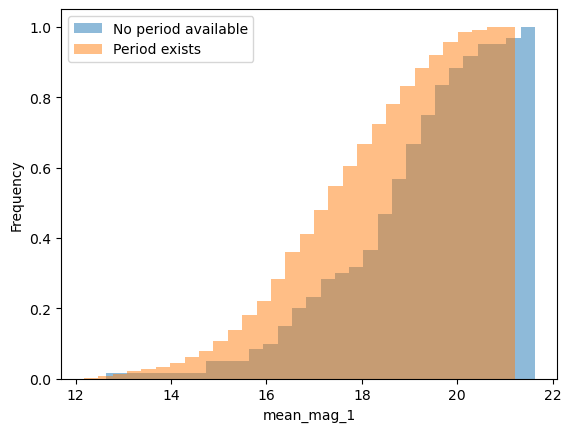

In [15]:
df.loc[df.Period_band_1.isna()].mean_mag_1.plot.hist(bins=30, cumulative=True, density=True, alpha=0.5, label="No period available")
df.loc[df.Period_band_1.notna()].mean_mag_1.plot.hist(bins=30, cumulative=True, density=True, alpha=0.5, label="Period exists")
plt.xlabel("mean_mag_1")
plt.legend()
stats.ks_2samp(df.loc[df.Period_band_1.isna()].mean_mag_1.dropna(), df.loc[df.Period_band_1.notna()].mean_mag_1.dropna())

The period is not missing at random! We can see a significant difference in the distributions of the variables Mean_mag_1 for the sample with and without periods. Note also that some data points have neither period nor mean_mag_1.

We can also use our domain knowledge to say that the missing period is not missing because of the value of the period itself, but because the objects that are dimmer (larger magnitudes) are more difficult to measure.

KstestResult(statistic=0.34018743109151045, pvalue=2.6062939767229533e-06, statistic_location=18.291267475328947, statistic_sign=-1)

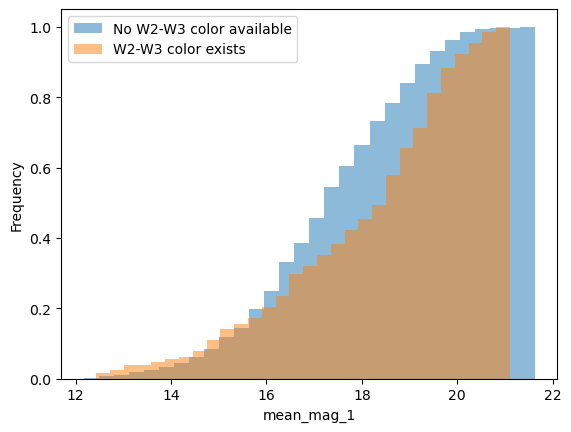

In [16]:
df.loc[df["W2-W3_0"].isna()].mean_mag_1.plot.hist(bins=30, cumulative=True, density=True, alpha=0.5, label="No W2-W3 color available")
df.loc[df["W2-W3_0"].notna()].mean_mag_1.plot.hist(bins=30, cumulative=True, density=True, alpha=0.5, label="W2-W3 color exists")
plt.xlabel("mean_mag_1")
plt.legend()
stats.ks_2samp(df.loc[df.Period_band_1.isna()].mean_mag_1.dropna(), df.loc[df.Period_band_1.notna()].mean_mag_1.dropna())

In this case, the existence of the W2-W3 IR color of the object is dependent on the mean_mag_1 magnitude. In this case, the value of the IR color is an indication with how red the object is (we are using domain knowledge), and hence how likely it is to have an IR color. 

### Imputation

Replace by arbitrary value

In [17]:
aux = df.fillna(-99)
aux

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aakgayt,0.608093,0.530428,0.999978,0.999754,1.0,1.0,0.315789,0.210526,0.000000,0.0,...,9.0,38.0,34.0,15.0,0.357895,0.394737,-99.000000,-99.000000,0.651429,1.000000
ZTF18abjbxku,1.919376,0.820454,1.000000,0.995996,4.0,3.0,0.558442,0.500000,0.053333,0.0,...,0.0,12.0,10.0,12.0,0.129870,0.666667,-99.000000,-99.000000,0.825714,0.500000
ZTF19aaafpst,0.545609,0.402965,1.000000,1.000000,1.0,1.0,0.338235,0.442308,0.000000,0.0,...,1.0,1.0,29.0,19.0,0.426471,0.365385,-99.000000,-99.000000,0.897857,0.994167
ZTF18acgmekk,0.073884,0.067873,0.917473,0.330160,1.0,1.0,0.363636,0.363636,0.000000,0.0,...,3.0,0.0,0.0,0.0,0.000000,0.000000,-99.000000,-99.000000,0.881429,0.986667
ZTF20acnvxgx,0.121103,0.108838,0.792119,0.999600,2.0,1.0,0.200000,0.142857,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,5.071728,5.609728,0.910000,0.976625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18acgrygj,0.605908,0.408492,1.000000,1.000000,1.0,1.0,0.419355,0.384615,0.000000,0.0,...,0.0,1.0,25.0,15.0,0.403226,0.192308,-99.000000,-99.000000,0.903572,0.996625
ZTF20aadcqyq,0.290529,0.253901,0.825191,0.344433,12.0,12.0,0.260870,0.311475,0.000000,0.0,...,11.0,3.0,0.0,0.0,0.000000,0.000000,-99.000000,-99.000000,0.883572,1.000000
ZTF20abpmupf,0.144965,0.123817,0.996063,0.980195,1.0,5.0,0.307692,0.232143,0.000000,0.0,...,35.0,25.0,39.0,56.0,1.000000,1.000000,-99.000000,-99.000000,0.848571,0.986250


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

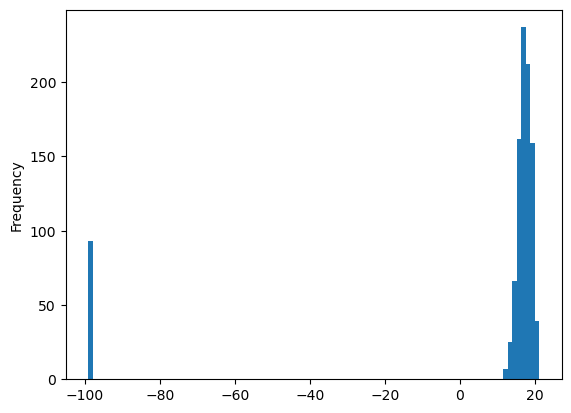

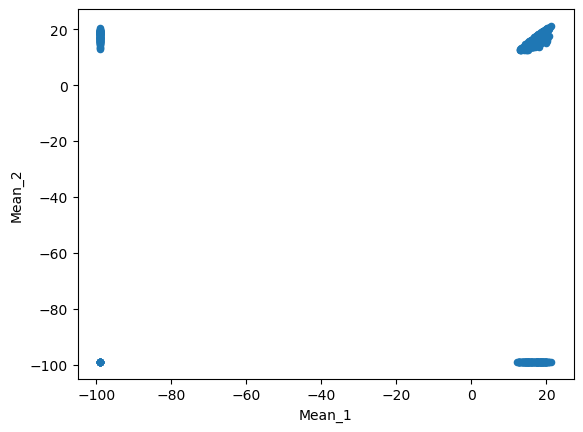

In [18]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [19]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

Replace by the median value

In [20]:
aux = df.fillna(df.median())

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

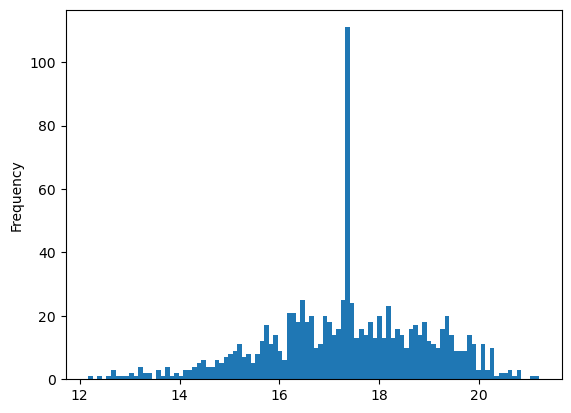

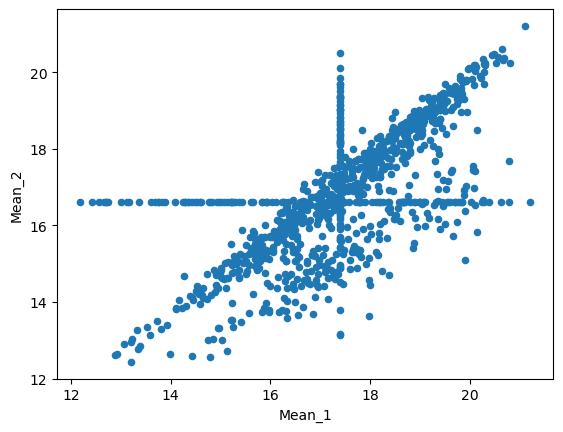

In [21]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [22]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

Replace with data sampled from the same dimension

In [23]:
df.Amplitude_1.fillna(pd.Series(index=df[df.Amplitude_1.isna()].index, 
                                data=df.Amplitude_1.dropna().sample(df.Amplitude_1.isna().sum(), replace=True).values))

oid
ZTF18aakgayt    0.608093
ZTF18abjbxku    1.919376
ZTF19aaafpst    0.545609
ZTF18acgmekk    0.073884
ZTF20acnvxgx    0.121103
                  ...   
ZTF18acgrygj    0.605908
ZTF20aadcqyq    0.290529
ZTF20abpmupf    0.144965
ZTF18aczejsh    0.728461
ZTF17aabiamd    0.706658
Name: Amplitude_1, Length: 1000, dtype: float64

Let's do it column by column

In [24]:
for col in list(df):
    df[col] = df[col].fillna(pd.Series(index=df[df[col].isna()].index, 
                                data=df[col].dropna().sample(df[col].isna().sum(), replace=True).values))

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

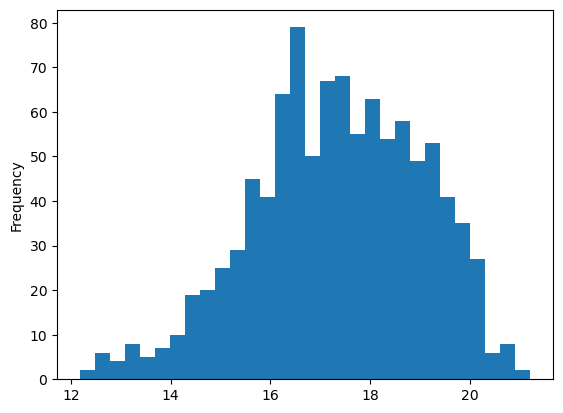

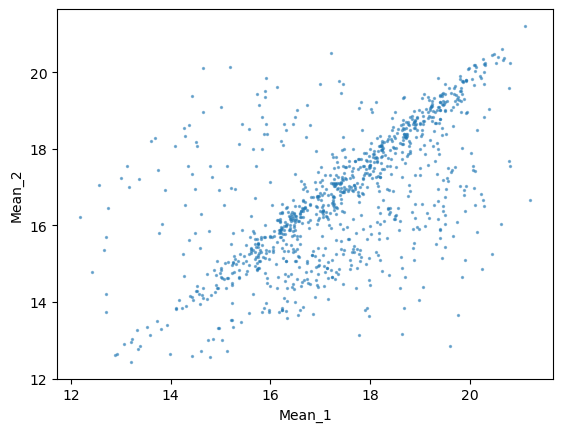

In [25]:
df.Mean_1.plot.hist(bins=30)
df.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

In [26]:
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aakgayt,0.608093,0.530428,0.999978,0.999754,1.0,1.0,0.315789,0.210526,0.000000,0.0,...,9.0,38.0,34.0,15.0,0.357895,0.394737,4.902875,6.277187,0.651429,1.000000
ZTF18abjbxku,1.919376,0.820454,1.000000,0.995996,4.0,3.0,0.558442,0.500000,0.053333,0.0,...,0.0,12.0,10.0,12.0,0.129870,0.666667,3.746938,7.239263,0.825714,0.500000
ZTF19aaafpst,0.545609,0.402965,1.000000,1.000000,1.0,1.0,0.338235,0.442308,0.000000,0.0,...,1.0,1.0,29.0,19.0,0.426471,0.365385,4.568087,7.864252,0.897857,0.994167
ZTF18acgmekk,0.073884,0.067873,0.917473,0.330160,1.0,1.0,0.363636,0.363636,0.000000,0.0,...,3.0,0.0,0.0,0.0,0.000000,0.000000,3.861929,8.090137,0.881429,0.986667
ZTF20acnvxgx,0.121103,0.108838,0.792119,0.999600,2.0,1.0,0.200000,0.142857,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,5.071728,5.609728,0.910000,0.976625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18acgrygj,0.605908,0.408492,1.000000,1.000000,1.0,1.0,0.419355,0.384615,0.000000,0.0,...,0.0,1.0,25.0,15.0,0.403226,0.192308,5.029148,7.480244,0.903572,0.996625
ZTF20aadcqyq,0.290529,0.253901,0.825191,0.344433,12.0,12.0,0.260870,0.311475,0.000000,0.0,...,11.0,3.0,0.0,0.0,0.000000,0.000000,0.722269,6.845744,0.883572,1.000000
ZTF20abpmupf,0.144965,0.123817,0.996063,0.980195,1.0,5.0,0.307692,0.232143,0.000000,0.0,...,35.0,25.0,39.0,56.0,1.000000,1.000000,4.644040,9.215025,0.848571,0.986250


In [27]:
#points = datashade(hv.Points(df[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

Let's go back to the original data again

In [28]:
df = pd.read_pickle("data/features_small.pickle")
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df = df.pivot(index="oid", columns=["fname"], values="value")
df = df.sample(1000, random_state=42)

Let's try scikit learn Simple Imputer instead.
See https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn.impute.SimpleImputer

In [29]:
from sklearn.impute import SimpleImputer

Use the simple imputer to replace by the mean

In [30]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(df)
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

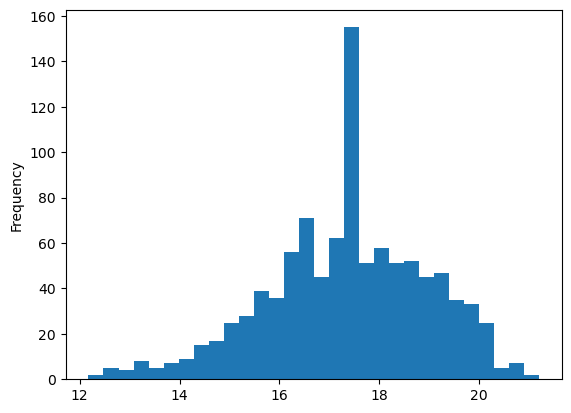

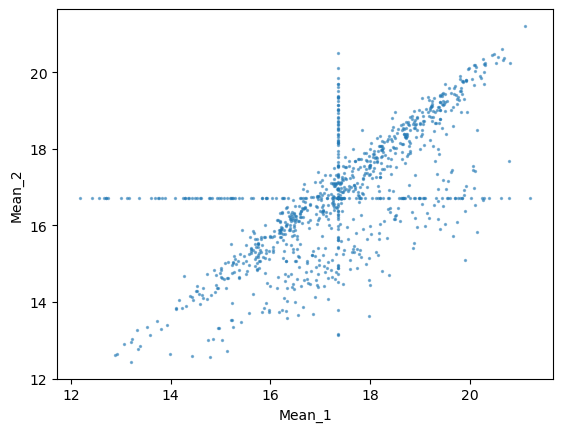

In [31]:
aux.Mean_1.plot.hist(bins=30)
aux.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

In [32]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

Replace by the most frequent value

In [33]:
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp.fit(df)
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

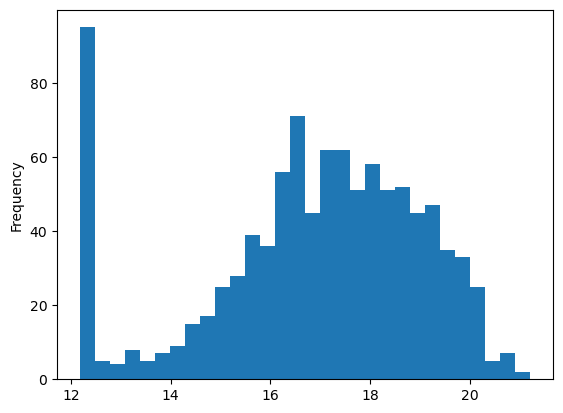

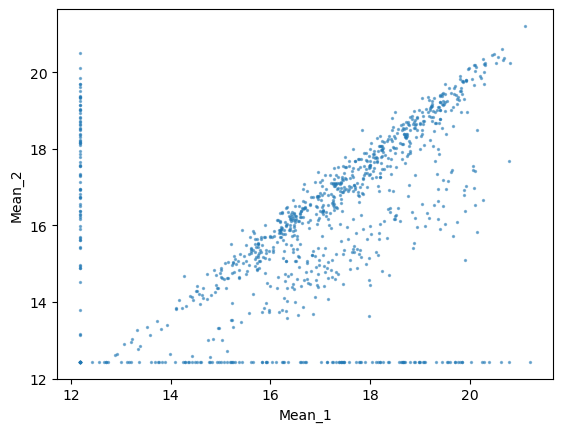

In [34]:
aux.Mean_1.plot.hist(bins=30)
aux.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

In [35]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

Imputation based on feature correlations (slow)

In [36]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(df)

IterativeImputer(random_state=0)

In [37]:
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

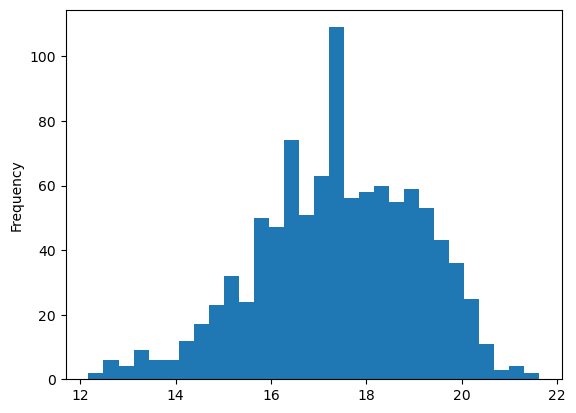

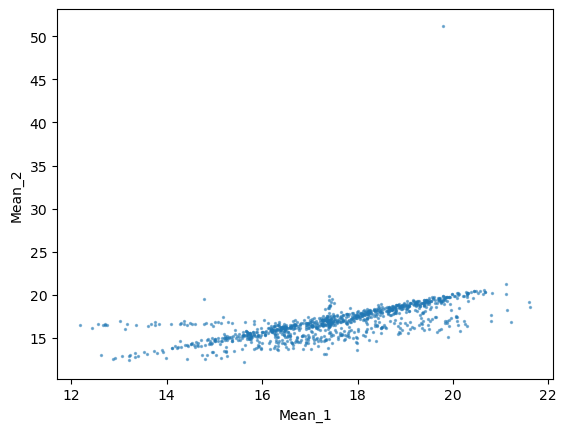

In [38]:
aux.Mean_1.plot.hist(bins=30)
aux.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

In [39]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

Let's apply standard scaler first

In [40]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df)

In [41]:
imp.fit(df_scaled)

/home/fforster/anaconda3/lib/python3.13/site-packages/sklearn/impute/_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


IterativeImputer(random_state=0)

In [42]:
aux = pd.DataFrame(index=df.index, data=imp.transform(df_scaled), columns=list(df))

<Axes: xlabel='Mean_1', ylabel='Mean_2'>

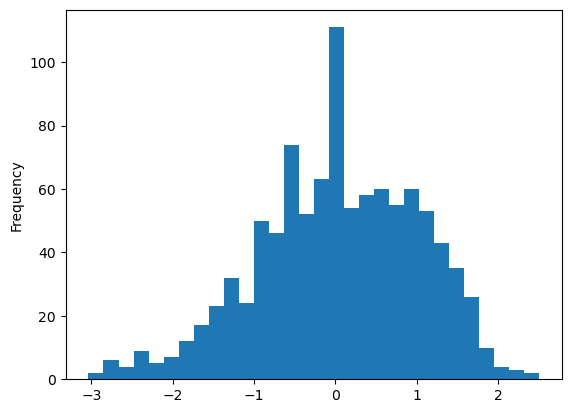

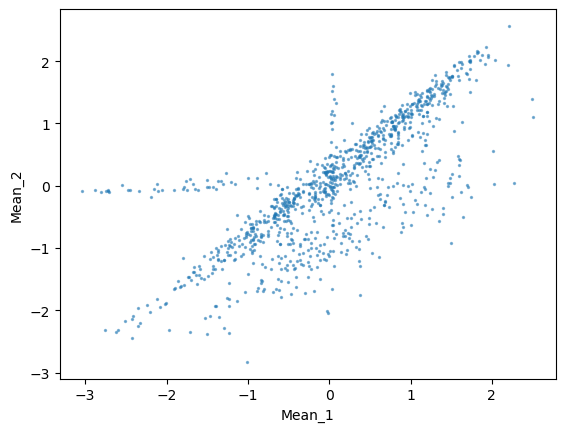

In [43]:
aux.Mean_1.plot.hist(bins=30)
aux.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

In [44]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points.options(ylim=(-10, 10))

In [45]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2, weights="uniform")
imputer.fit(df_scaled)
aux = pd.DataFrame(index=df.index, data=imputer.transform(df_scaled), columns=list(df))

In [46]:
aux = pd.DataFrame(index=df.index, data=scaler.inverse_transform(aux), columns=list(df))

In [47]:
aux

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aakgayt,0.608093,0.530428,0.999978,0.999754,1.0,1.0,0.315789,0.210526,0.000000,0.0,...,9.0,38.0,34.0,15.0,0.357895,3.947368e-01,3.482189,3.815190,0.651429,1.000000
ZTF18abjbxku,1.919376,0.820454,1.000000,0.995996,4.0,3.0,0.558442,0.500000,0.053333,0.0,...,0.0,12.0,10.0,12.0,0.129870,6.666667e-01,9.257582,10.103082,0.825714,0.500000
ZTF19aaafpst,0.545609,0.402965,1.000000,1.000000,1.0,1.0,0.338235,0.442308,0.000000,0.0,...,1.0,1.0,29.0,19.0,0.426471,3.653846e-01,1.876731,3.325231,0.897857,0.994167
ZTF18acgmekk,0.073884,0.067873,0.917473,0.330160,1.0,1.0,0.363636,0.363636,0.000000,0.0,...,3.0,0.0,0.0,0.0,0.000000,-5.551115e-17,2.384932,4.297932,0.881429,0.986667
ZTF20acnvxgx,0.121103,0.108838,0.792119,0.999600,2.0,1.0,0.200000,0.142857,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,-5.551115e-17,5.071728,5.609728,0.910000,0.976625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18acgrygj,0.605908,0.408492,1.000000,1.000000,1.0,1.0,0.419355,0.384615,0.000000,0.0,...,0.0,1.0,25.0,15.0,0.403226,1.923077e-01,3.292847,3.853347,0.903572,0.996625
ZTF20aadcqyq,0.290529,0.253901,0.825191,0.344433,12.0,12.0,0.260870,0.311475,0.000000,0.0,...,11.0,3.0,0.0,0.0,0.000000,-5.551115e-17,4.633484,8.064984,0.883572,1.000000
ZTF20abpmupf,0.144965,0.123817,0.996063,0.980195,1.0,5.0,0.307692,0.232143,0.000000,0.0,...,35.0,25.0,39.0,56.0,1.000000,1.000000e+00,4.481287,7.689286,0.848571,0.986250


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

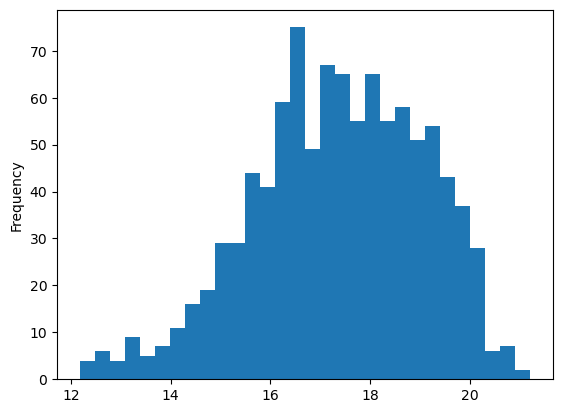

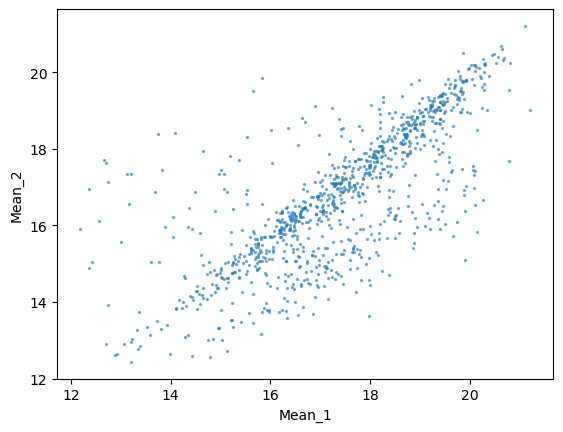

In [48]:
aux.Mean_1.plot.hist(bins=30)
aux.plot.scatter(x="Mean_1", y="Mean_2", s=2, alpha=0.5)

In [49]:
#points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
#points

# Some basic statistics

Now we will run some basic statistics over all the columns and will plot them

In [50]:
df = pd.read_pickle("data/features_small.pickle")
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df = df.pivot(index="oid", columns=["fname"], values="value")
df = df.sample(1000, random_state=42)

In [51]:
dfstats = df.describe()
dfstats

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
count,907.000000,862.000000,907.000000,862.000000,907.000000,862.000000,907.000000,862.000000,907.000000,862.000000,...,967.000000,935.000000,967.000000,935.000000,967.000000,935.000000,123.000000,123.000000,1000.000000,1000.000000
mean,0.555075,0.475490,0.896406,0.884331,2.798236,2.719258,0.337507,0.326561,0.002405,0.002243,...,5.360910,6.762567,29.579111,26.701604,0.477535,0.472170,4.777310,6.714066,0.812975,0.878174
std,0.509354,0.431108,0.212705,0.217815,4.271172,4.557296,0.107452,0.096619,0.010066,0.009088,...,17.857587,15.789206,38.044483,36.491085,0.348169,0.350231,2.067790,2.378952,0.083034,0.227819
min,0.017712,0.018255,0.180443,0.148095,1.000000,1.000000,0.047619,0.058824,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.722269,0.875657,0.590714,0.000000
25%,0.223992,0.188923,0.937242,0.890402,1.000000,1.000000,0.272727,0.263577,0.000000,0.000000,...,0.000000,0.000000,4.000000,3.000000,0.189356,0.163333,3.801762,4.859404,0.751964,0.926823
50%,0.433590,0.371665,0.999981,0.999936,1.000000,1.000000,0.333333,0.328826,0.000000,0.000000,...,1.000000,3.000000,17.000000,15.000000,0.435897,0.435897,4.795193,7.575190,0.822857,0.987958
75%,0.695846,0.618372,1.000000,1.000000,3.000000,2.000000,0.405405,0.391745,0.000000,0.000000,...,5.000000,8.000000,41.000000,36.000000,0.765116,0.764391,5.719422,8.224176,0.881429,0.997917
max,3.396875,2.823007,1.000000,1.000000,63.000000,63.000000,0.666667,0.629032,0.118881,0.084656,...,414.000000,324.000000,365.000000,316.000000,1.000000,1.000000,11.489245,12.645245,0.967143,1.000000


# Data normality

Now the objective is to make the data as normal as possible by applying transformations.

The reason to do this is that many methods assume Gaussianity in their derivation, so let's try to make the data look as normal as possible.

Let's start by doing a box plot of all the variables, but before that we will use the imputed version of the dataframe.

In [52]:
df = aux

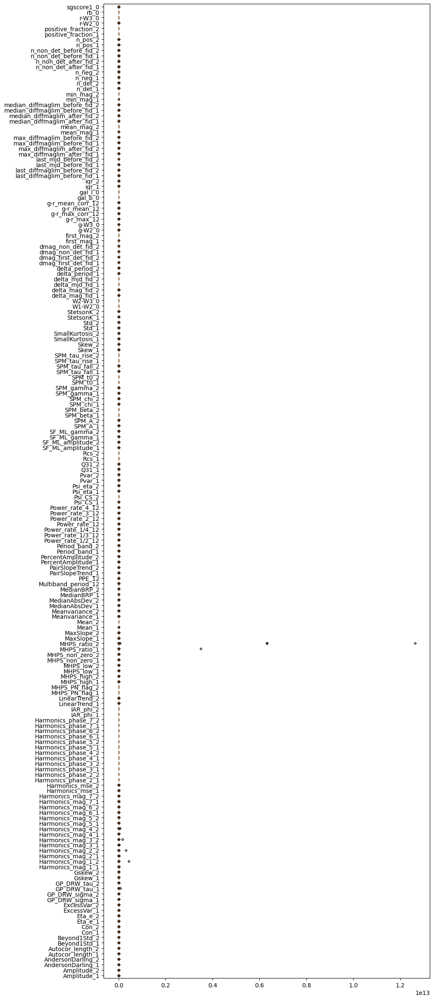

In [53]:
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(df, vert=False, tick_labels=list(df), flierprops={'marker':'.'});

We don't see much, let's use the asinh scaling to see both small and large values, positive or negative.

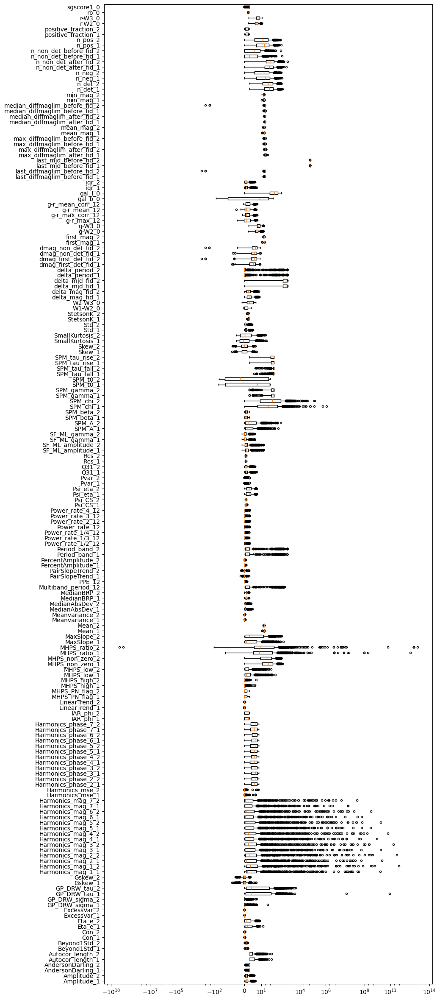

In [54]:
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(df, vert=False, tick_labels=list(df), flierprops={'marker':'.'});
ax.set_xscale('asinh', linthresh=0.1)

We can see that the boxplots are full of outliers, this means that the data is far from normal.

In fact, some variables need to be plotted in log-log to really understand their distribution


<Axes: ylabel='Frequency'>

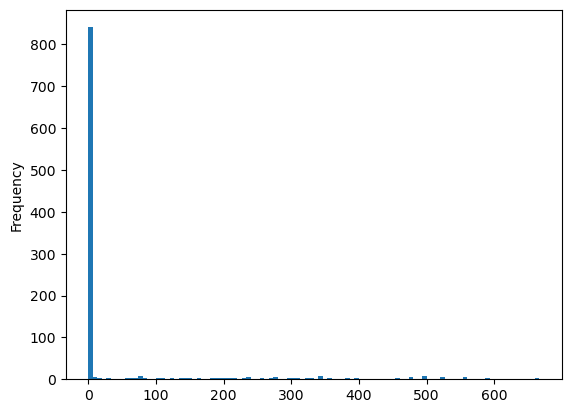

In [55]:
aux.Multiband_period_12.plot.hist(bins=100)

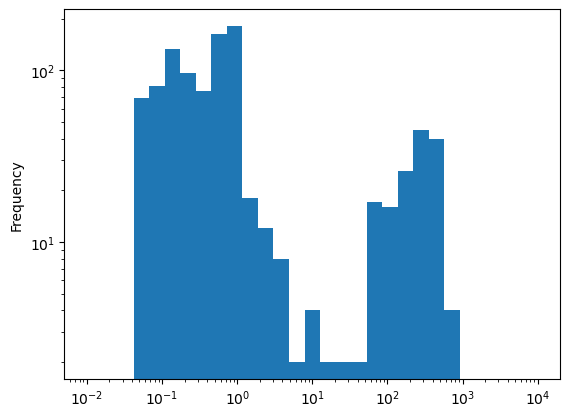

In [56]:
df.Multiband_period_12.plot.hist(log=True, bins=np.logspace(-2, 4, 30))
plt.xscale('log')

Let's try scaling the data first

In [57]:
from sklearn.preprocessing import RobustScaler, QuantileTransformer, StandardScaler

In [58]:
df = aux

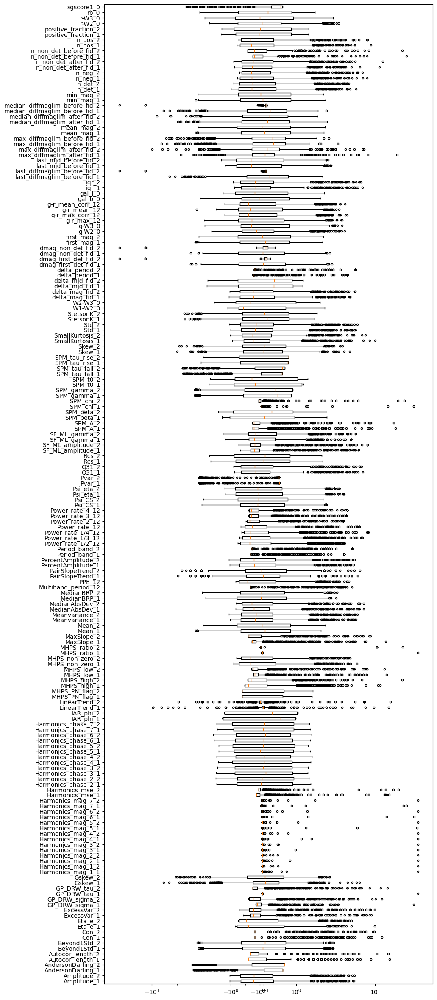

In [59]:
scaler = StandardScaler().fit(df)
dft = pd.DataFrame(data=scaler.transform(df), index=df.index, columns=list(df))
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dft.dropna(), vert=False, tick_labels=list(df), flierprops={'marker':'.'})
ax.set_xscale('asinh', linthresh=0.1)

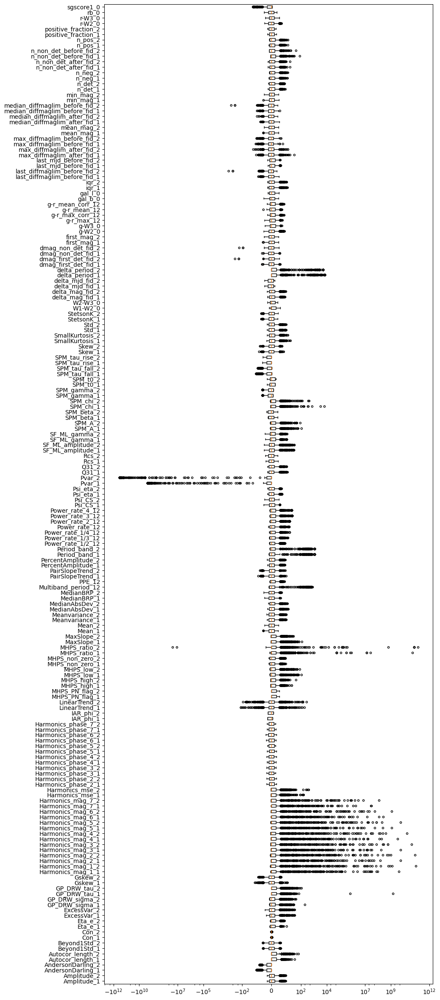

In [60]:
scaler_r = RobustScaler().fit(df)
dftr = pd.DataFrame(data=scaler_r.transform(df), index=df.index, columns=list(df))
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dftr.dropna(), vert=False, tick_labels=list(df), flierprops={'marker':'.'})
ax.set_xscale('asinh', linthresh=0.1)

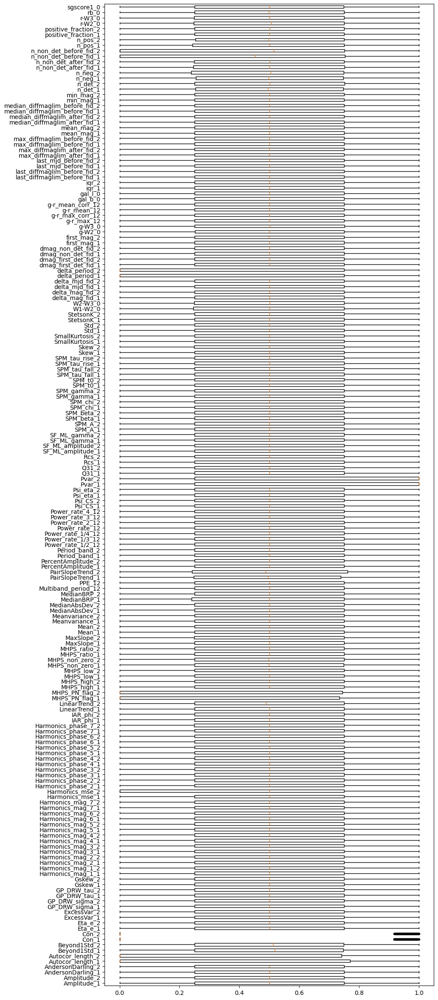

In [61]:
scaler_q = QuantileTransformer(output_distribution="uniform").fit(df)
dftq = pd.DataFrame(data=scaler_q.transform(df), index=df.index, columns=list(df))
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dftq.dropna(), vert=False, tick_labels=list(df), flierprops={'marker':'.'});
#ax.set_xscale('asinh', linthresh=0.1)

Now we will focus on the data normality

In [62]:
from scipy import stats

We will use the Shapiro-Wilk normality test (https://en.wikipedia.org/wiki/Shapiro%E2%80%93Wilk_test). We will use  a sample of 500 rows to focus on those columns where the effect is stronger.

<Axes: ylabel='Frequency'>

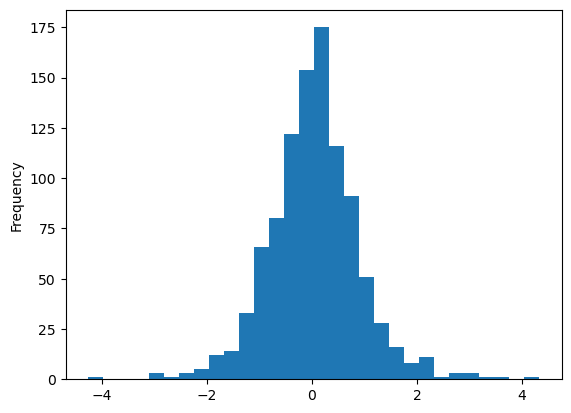

In [63]:
df.Skew_1.plot.hist(bins=30)

In [64]:
stats.shapiro(df.Skew_1.dropna().sample(500))

ShapiroResult(statistic=0.9634268874960819, pvalue=8.034814326854136e-10)

The p-value indicates a strong deviation from normality

Let's do this for all the columns

<Axes: >

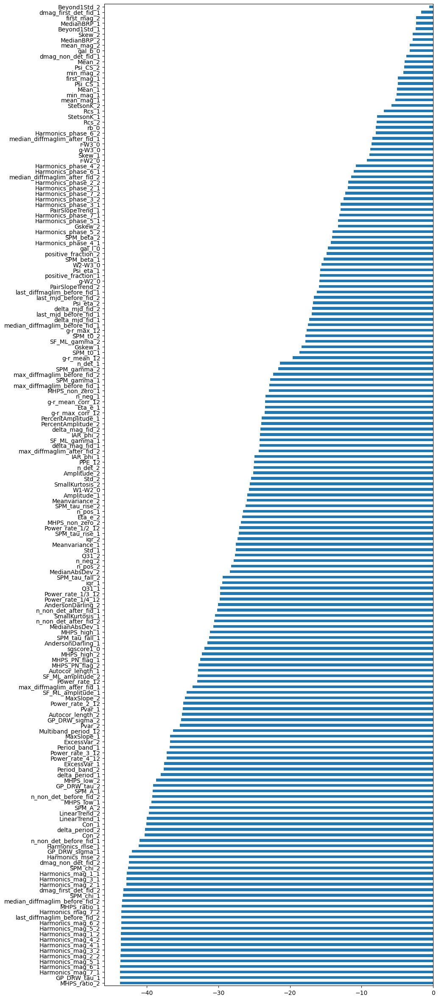

In [82]:
SW = dft.sample(500).apply(lambda col: np.log10(stats.shapiro(col.dropna()).pvalue), axis=0)
SW.sort_values().plot.barh(figsize=(10, 30))
#plt.xscale('log')

In [83]:
display(pd.DataFrame(SW.sort_values()))

,0
MHPS_ratio_2,-43.711406
GP_DRW_tau_1,-43.711211
Harmonics_mag_7_1,-43.704868
Harmonics_mag_6_1,-43.699424
Harmonics_mag_5_1,-43.683344
...,...
Beyond1Std_1,-2.430867
MedianBRP_1,-2.384589
first_mag_2,-2.370565
dmag_first_det_fid_1,-1.662695


<Axes: ylabel='Frequency'>

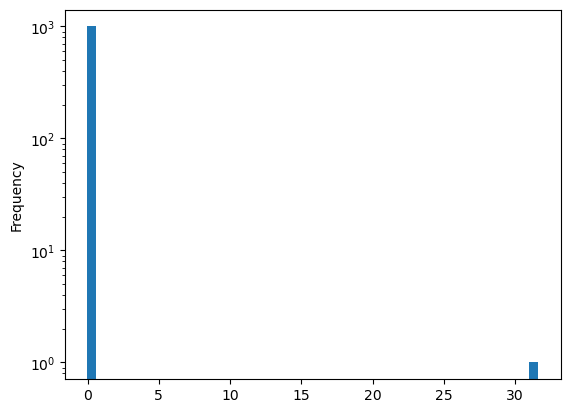

In [84]:
dft.GP_DRW_tau_1.plot.hist(bins=50, log=True)

## PowerTransform

Power transforms are a family of parametric, monotonic transformations that are applied to make data more Gaussian-like. This is useful for modeling issues related to heteroscedasticity (non-constant variance), or other situations where normality is desired.

Currently, PowerTransformer supports the Box-Cox transform and the Yeo-Johnson transform. The optimal parameter for stabilizing variance and minimizing skewness is estimated through maximum likelihood.

Box-Cox requires input data to be strictly positive, while Yeo-Johnson supports both positive or negative data.

By default, zero-mean, unit-variance normalization is applied to the transformed data.

Box-Cox

![BoxCox](boxcox.png)

Yeo-Johnson

![Yeo-Johnson](yeo-johnson.png)


![pt](powertransform.png)

![pt2](sklearn_powertransform.png)

In [85]:
from sklearn.preprocessing import PowerTransformer

In [86]:
power = PowerTransformer(method='yeo-johnson', standardize=False)

In [87]:
power.fit(dft)

PowerTransformer(standardize=False)

In [88]:
dftp = pd.DataFrame(data=power.transform(dft), columns=list(dft), index=dft.index)
dftp

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aakgayt,0.127437,0.170726,1.048880,1.092292,-0.769163,-0.702587,-0.186154,-1.229814,-0.706665,-0.704176,...,0.148747,0.535812,0.112996,-0.372794,-0.366686,-0.232883,-0.608749,-1.004611,-1.604194,1.106952
ZTF18abjbxku,1.153020,0.596774,1.049195,1.044005,0.209167,0.088349,2.021131,1.872496,0.129551,-0.704176,...,-0.526289,0.238140,-0.722265,-0.507417,-1.088737,0.534496,1.867034,1.809003,0.157046,-0.444601
ZTF19aaafpst,0.014400,-0.124818,1.049195,1.095500,-0.769163,-0.702587,0.029246,1.239119,-0.706665,-0.704176,...,-0.383975,-0.586658,-0.009662,-0.213933,-0.160309,-0.321801,-1.719597,-1.260755,1.158225,1.020374
ZTF18acgmekk,-1.449547,-1.456327,0.203217,-0.632321,-0.769163,-0.702587,0.269003,0.385051,-0.706665,-0.704176,...,-0.164912,-0.741434,-1.274543,-1.189339,-1.520145,-1.506793,-1.347607,-0.756705,0.915572,0.915141
ZTF20acnvxgx,-1.251475,-1.247852,-0.260633,1.090293,-0.225785,-0.702587,-1.338292,-1.928708,-0.706665,-0.704176,...,-0.526289,-0.741434,-1.274543,-1.189339,-1.520145,-1.506793,0.271743,-0.109840,1.342436,0.784509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18acgrygj,0.123738,-0.109773,1.049195,1.095500,-0.769163,-0.702587,0.783264,0.611482,-0.706665,-0.704176,...,-0.526289,-0.586658,-0.125761,-0.372794,-0.229617,-0.866778,-0.729466,-0.984848,1.244415,1.056344
ZTF20aadcqyq,-0.637244,-0.613474,-0.189713,-0.628219,0.444411,0.351291,-0.725319,-0.172325,-0.706665,-0.704176,...,0.194885,-0.328349,-1.274543,-1.189339,-1.520145,-1.506793,0.054180,0.979440,0.946780,1.106952
ZTF20abpmupf,-1.155888,-1.174883,0.993892,0.853538,-0.769163,0.260441,-0.264640,-1.005112,-0.706665,-0.704176,...,0.333646,0.457978,0.216049,0.514279,1.368354,1.379303,-0.025748,0.820633,0.455147,0.909486


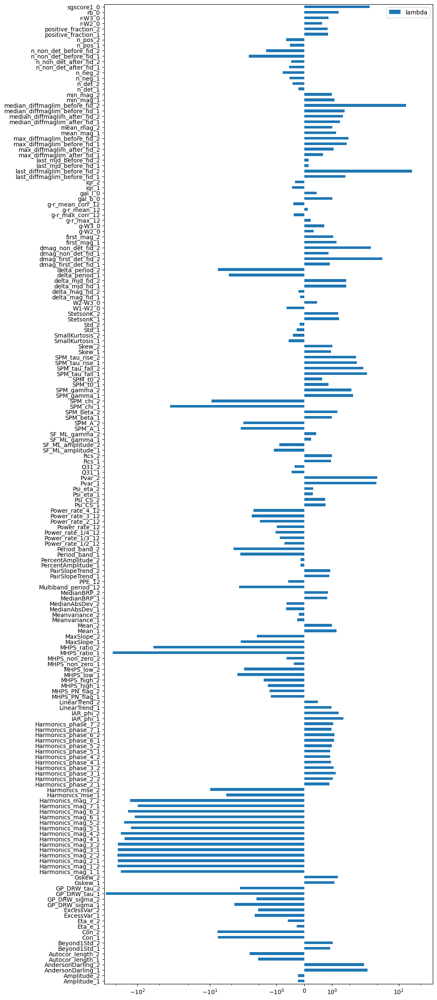

In [89]:
pd.DataFrame(data=power.lambdas_, columns=["lambda"], index=list(df)).plot.barh(figsize=(10, 30))
plt.xscale('asinh')

Let's look at one variable

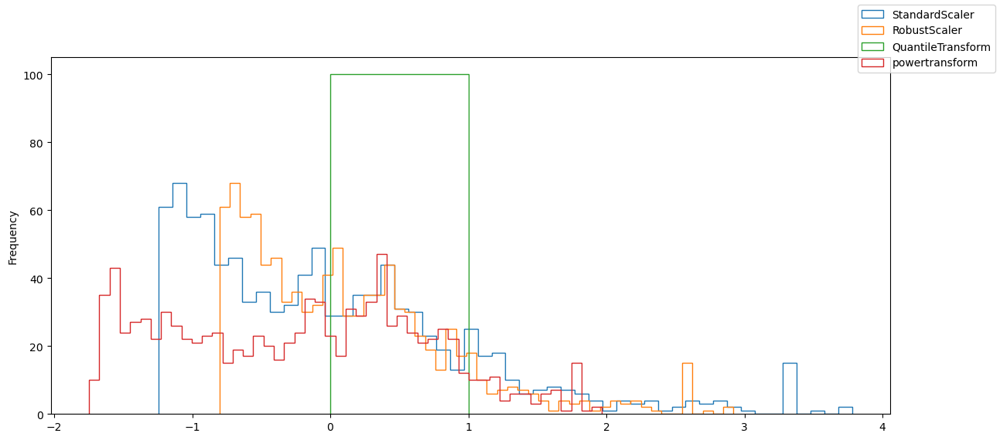

In [90]:
fig, ax = plt.subplots(figsize=(14, 6))
#df.min_mag_1.plot.hist(bins=50, ax=ax, label="original", alpha=0.7, )
var = 'Psi_eta_2'
dft[var].plot.hist(bins=50, ax=ax, label='StandardScaler', histtype='step')
dftr[var].plot.hist(bins=50, ax=ax, label='RobustScaler', histtype='step')
dftq[var].plot.hist(bins=10, ax=ax, label='QuantileTransform', histtype='step')
dftp[var].plot.hist(bins=50, ax=ax, label='powertransform', histtype='step')
fig.legend()

We can see that the PowerTransform is the best transformation making the variables distributed closer to a Gaussian(0, 1)

Let's repeat the normality tests

<Axes: >

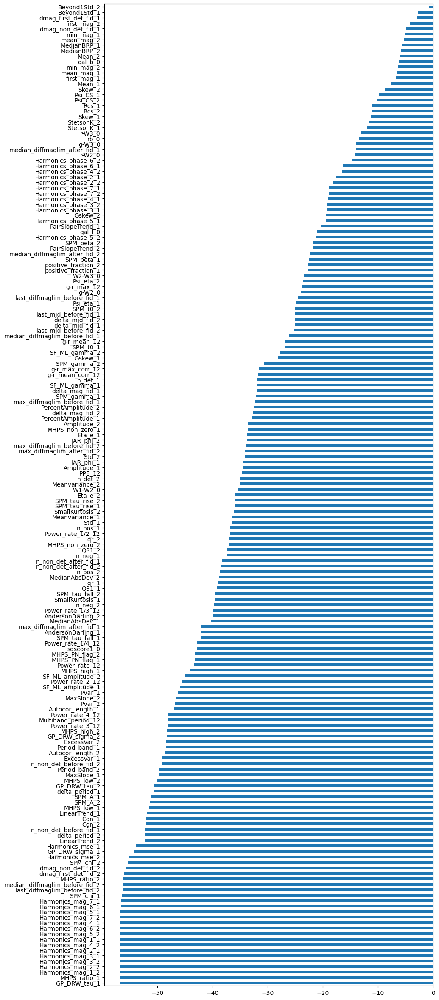

In [91]:
SWr = dftr.apply(lambda col: np.log10(stats.shapiro(col.dropna()).pvalue), axis=0)
SWr.sort_values().plot.barh(figsize=(10, 30))

<Axes: >

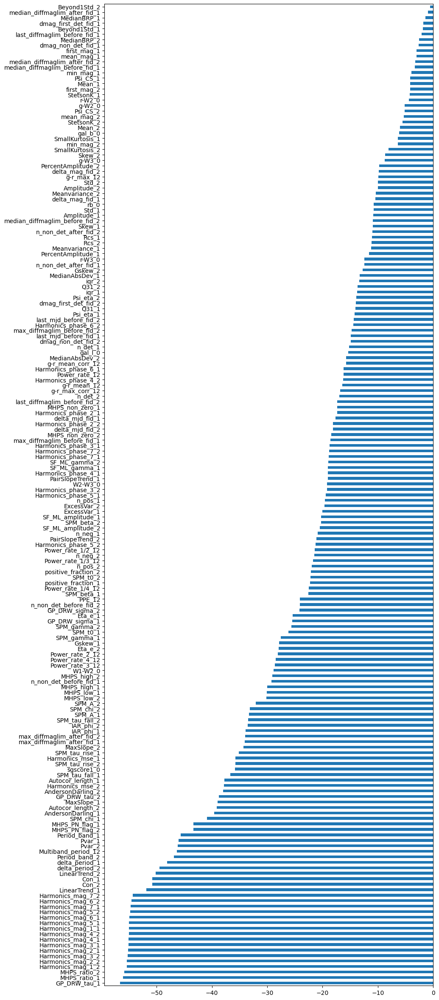

In [92]:
SWp = dftp.apply(lambda col: np.log10(stats.shapiro(col.dropna()).pvalue), axis=0)
SWp.sort_values().plot.barh(figsize=(10, 30))

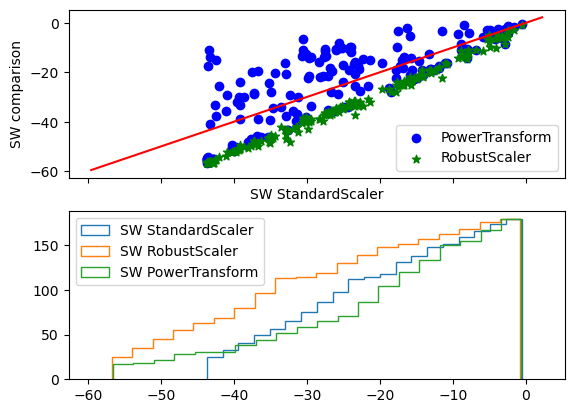

In [95]:
fig, ax = plt.subplots(nrows = 2, sharex=True)
ax[0].scatter(SW, SWp, c='b', label='PowerTransform')
ax[0].scatter(SW, SWr, c='g', marker='*', label='RobustScaler')
ax[0].set_xlabel("SW StandardScaler")
ax[0].set_ylabel("SW comparison")
ax[0].legend()
ax[1].hist(SW, bins=20, label="SW StandardScaler", cumulative=True, histtype='step')
ax[1].hist(SWr, bins=20, label="SW RobustScaler", cumulative=True, histtype='step')
ax[1].hist(SWp, bins=20, label="SW PowerTransform", cumulative=True, histtype='step')
ax[1].legend()
ax[0].plot(ax[0].get_xlim(), ax[0].get_xlim(), c='r')


We can see that for low SW p values power transform works better and robust scaler makes things worst in almost all cases.

Let's look at the box plots again

/tmp/ipykernel_202046/2555215445.py:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(dftp.dropna(), vert=False, labels=list(df), flierprops={'marker':'.'})


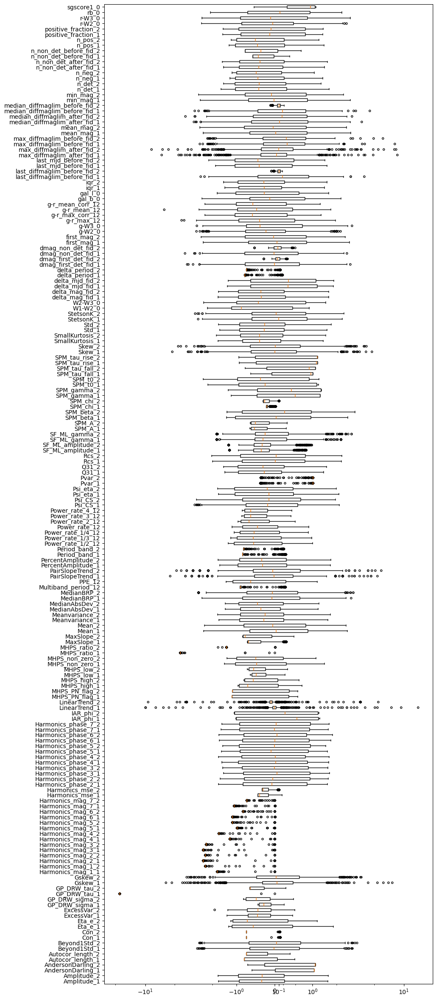

In [96]:
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dftp.dropna(), vert=False, labels=list(df), flierprops={'marker':'.'})
ax.set_xscale('asinh', linthresh=0.1)

# Correlations

Now that the variables are more normally distributed, let's look at the correlations

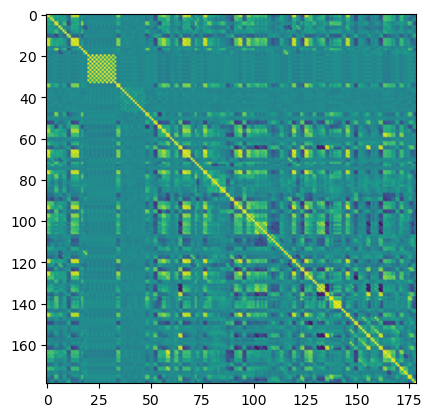

In [97]:
cm = dftp.corr() # if you use cov the covariance will not be normalized, try that as well
plt.imshow(cm)

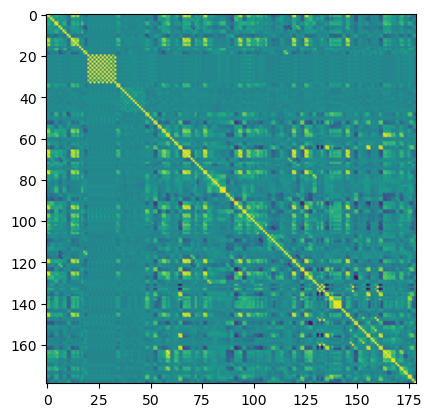

In [98]:
cm = dft.corr()
plt.imshow(cm)

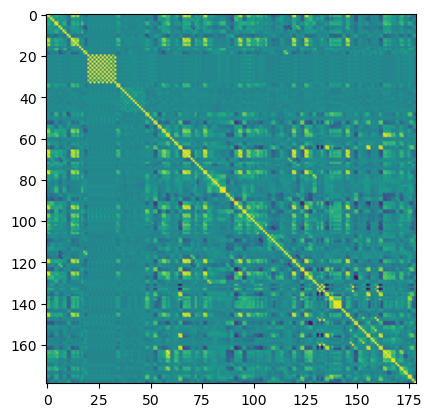

In [99]:
cm = dftr.corr()
plt.imshow(cm)

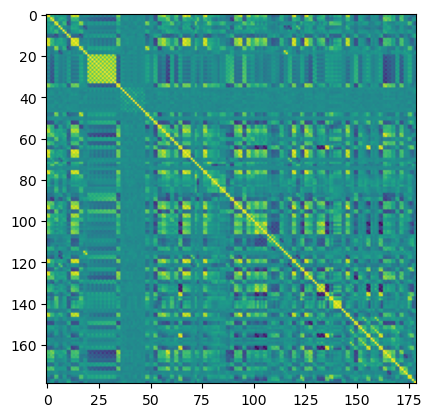

In [100]:
cm = dftq.corr()
plt.imshow(cm)

Correlation distribution

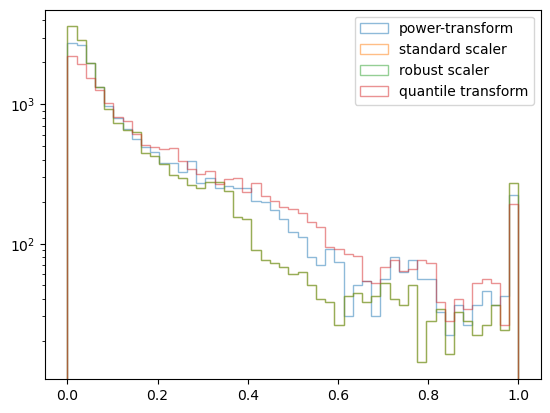

In [101]:
fig, ax = plt.subplots()
ax.hist(dftp.corr().to_numpy().flatten(), bins = np.linspace(0, 1, 50), lw=2, alpha=0.5, log=True, histtype='step', label='power-transform')
ax.hist(dft.corr().to_numpy().flatten(), bins = np.linspace(0, 1, 50) , lw=2, alpha=0.5, log=True, histtype='step', label='standard scaler')
ax.hist(dftr.corr().to_numpy().flatten(), bins = np.linspace(0, 1, 50), lw=2, alpha=0.5, log=True, histtype='step', label='robust scaler')
ax.hist(dftq.corr().to_numpy().flatten(), bins = np.linspace(0, 1, 50), lw=2, alpha=0.5, log=True, histtype='step', label='quantile transform')
ax.legend()

There is a trend of less concentrated correlation structure: standard/robust scaler -> power transform -> quantile transform

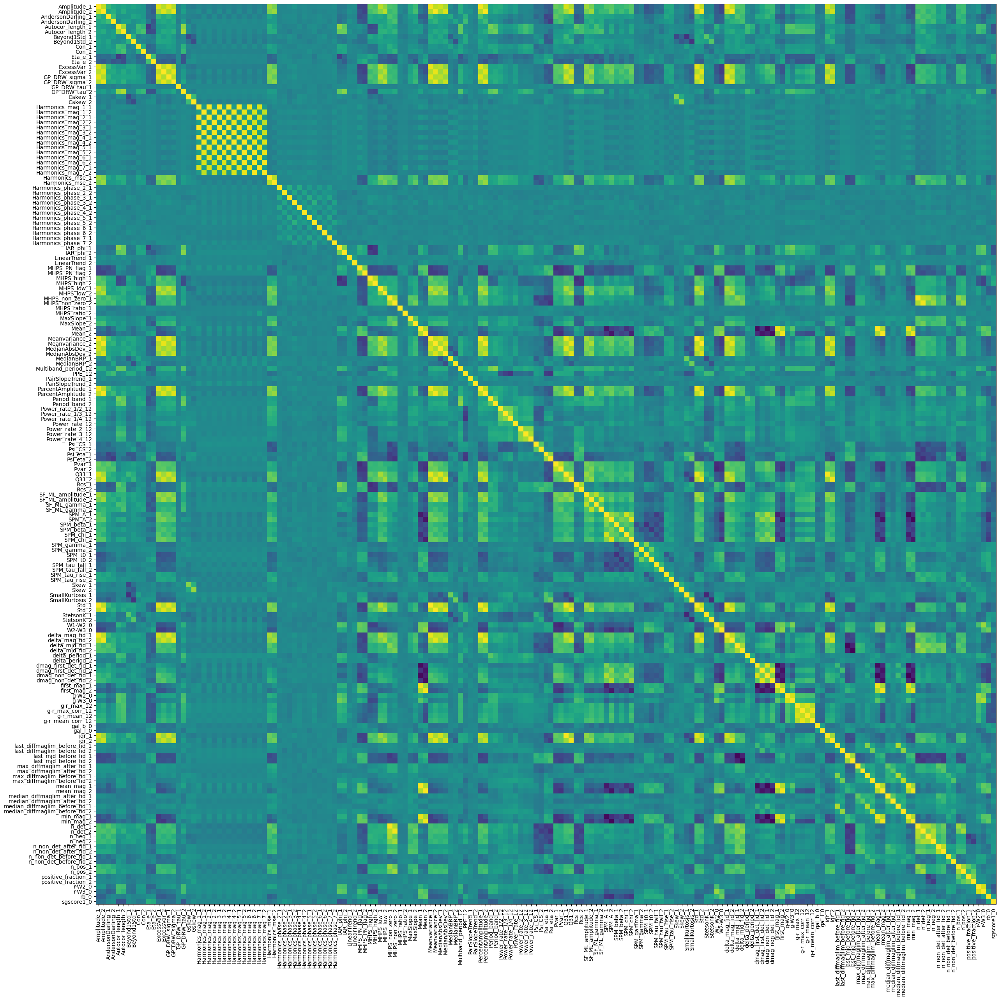

In [102]:
fig, ax = plt.subplots(figsize=(30, 30))
cm = dftp.corr()
ax.imshow(cm)
ax.set_yticks(range(dftp.shape[1]))
ax.set_yticklabels(list(dftp));
ax.set_xticks(range(dftp.shape[1]))
ax.set_xticklabels(list(dftp), rotation=90);

Let's sort this matrix. We will first define some distance between variables as 1-|corr|

In [103]:
distance_matrix = 1 - cm.abs()

Then we will use a hierarchical clustering algorithm to find groups 

In [104]:
import scipy.cluster.hierarchy as sch

In [105]:
linkage_matrix = sch.linkage(sch.distance.squareform(distance_matrix), method='complete')

In [106]:
# Reorder the correlation matrix according to the clustering
dendrogram = sch.dendrogram(linkage_matrix, no_plot=True)
index = dendrogram['leaves']
sorted_correlation_matrix = cm.iloc[index, :].iloc[:, index]

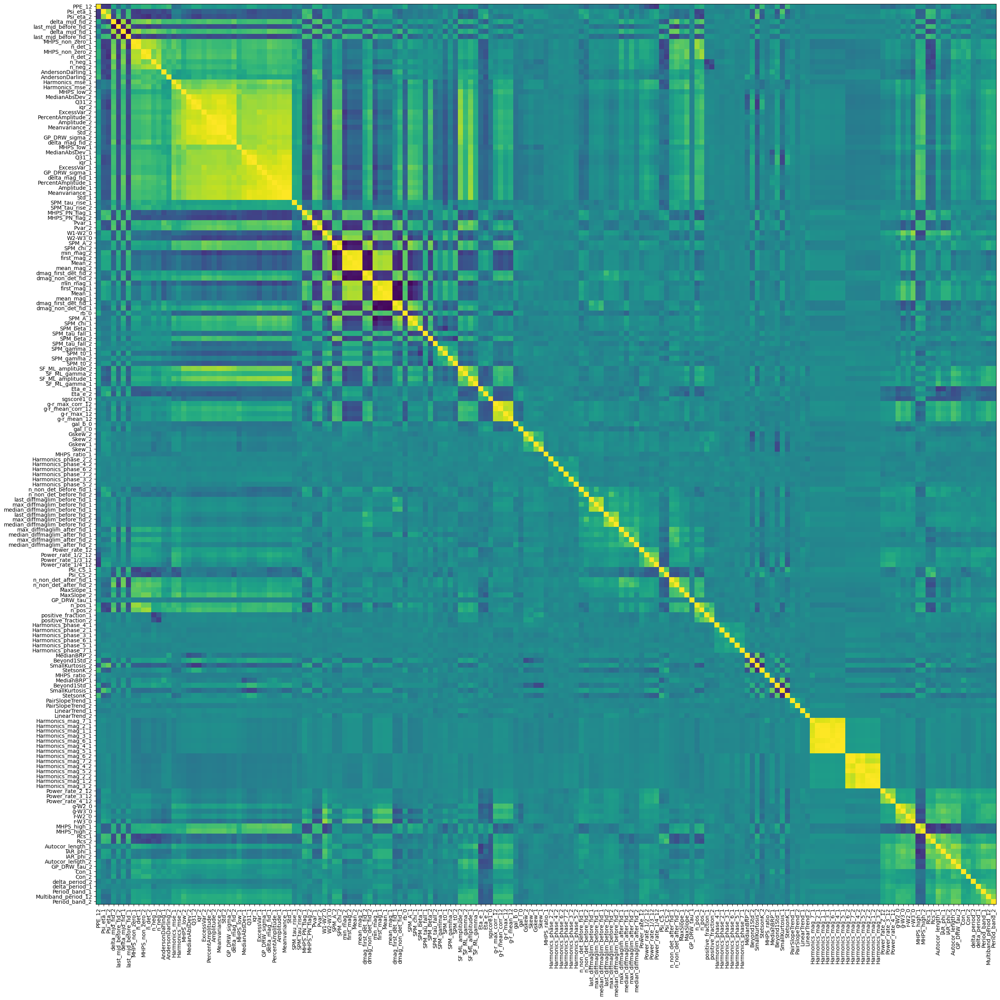

In [107]:
# Visualize the sorted correlation matrix
fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(sorted_correlation_matrix)
ax.set_yticks(range(dftp.shape[1]))
ax.set_yticklabels(np.array(list(dftp))[index]);
ax.set_xticks(range(dftp.shape[1]))
ax.set_xticklabels(np.array(list(dftp))[index], rotation=90);

## Beyond linear correlations: mutual information

Mutual Information (MI) is a measure of the amount of information obtained about one variable through another variable. It quantifies the dependency between two random variables. Unlike correlation, MI can capture both linear and non-linear relationships between variables.

Mathematically, for two discrete random variables X and Y, the Mutual Information is given by:

$\LARGE I(X;Y) = \sum_{x \in X} \sum_{y \in Y} P(x,y) \log\biggl(\frac{P(x, y)}{P(x) P(y)}\biggr)$

where P(x,y) is the joint probability distribution of X and Y, P(x) and P(y) are the marginal probability distributions of X and Y.


For continuous cases we can use:

$ \LARGE
I(X;Y) = \int_x \int_y p(x, y) \log \left( \frac{p(x, y)}{p(x) p(y)} \right) dx \, dy
$

where p(x, y) is the joint probability density function.

Mutual information is implemented in `sklearn.metrics` with `mutual_info_score` for the mutual information between labels, and in `mutual_info_regression` or `mutual_info_classif` for continuous (regression) and discrete (classification) variables, respectively.

See example from https://scikit-learn.org/stable/auto_examples/feature_selection/plot_f_test_vs_mi.html#sphx-glr-auto-examples-feature-selection-plot-f-test-vs-mi-py :

We consider 3 features $x_1$, $x_2$, $x_3$ distributed uniformly over [0, 1], the target depends on them as follows:

$\Large y = x_1 + sin(6 \pi  x_2) + 0.1  N(0, 1)$, that is the third feature is completely irrelevant.

The code below plots the dependency of y against individual x_i and normalized values of univariate linear regression F-tests statistics and mutual information.

As F-test captures only linear dependency, it rates x_1 as the most discriminative feature. On the other hand, mutual information can capture any kind of dependency between variables and it rates x_2 as the most discriminative feature, which probably agrees better with our intuitive perception for this example. Both methods correctly mark x_3 as irrelevant.

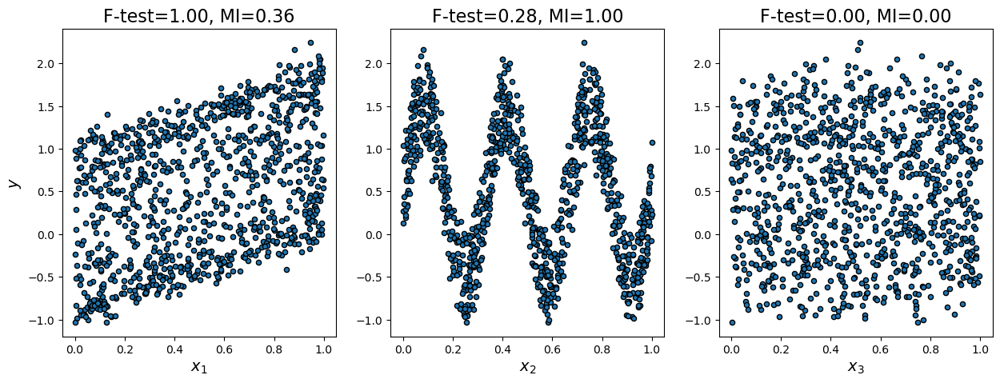

In [108]:
# Authors: The scikit-learn developers
# SPDX-License-Identifier: BSD-3-Clause

import matplotlib.pyplot as plt
import numpy as np

from sklearn.feature_selection import f_regression, mutual_info_regression

np.random.seed(0)
X = np.random.rand(1000, 3)
y = X[:, 0] + np.sin(6 * np.pi * X[:, 1]) + 0.1 * np.random.randn(1000)

f_test, _ = f_regression(X, y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X, y)
mi /= np.max(mi)

plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.scatter(X[:, i], y, edgecolor="black", s=20)
    plt.xlabel("$x_{}$".format(i + 1), fontsize=14)
    if i == 0:
        plt.ylabel("$y$", fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

Now we will create some functions to plot the mutual information matrix

In [109]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
from sklearn.preprocessing import LabelEncoder

def mutual_information_matrix(df, discrete_cols=None, random_state=42):
    """
    Compute the pairwise mutual information matrix for a DataFrame.

    For each pair (X, Y), mutual information is estimated by treating Y as
    the target and X as the feature, using sklearn's KNN-based estimator.
    The matrix is made symmetric by averaging MI(X->Y) and MI(Y->X).

    Parameters
    ----------
    df : pd.DataFrame
        Input data. All columns must be numeric. Encode categoricals first.
    discrete_cols : list of str, optional
        Column names that should be treated as discrete. Continuous columns
        use a KNN-based estimator; discrete columns use a histogram estimator.
        If None, all columns are treated as continuous.
    random_state : int
        Random seed for reproducibility.

    Returns
    -------
    mi_matrix : pd.DataFrame
        Symmetric matrix of pairwise mutual information values.
    """
    if discrete_cols is None:
        discrete_cols = []

    cols = df.columns.tolist()
    n = len(cols)
    mi = np.zeros((n, n))

    for i, col_i in enumerate(cols):
        
        print(i, col_i, end="\r")
        
        X = df[[col_i]].values
        is_discrete_i = col_i in discrete_cols

        for j, col_j in enumerate(cols):
            if i == j:
                # MI of a variable with itself is its entropy — set to 1.0
                # after normalisation, or skip and leave as 0 for the raw matrix
                mi[i, j] = np.nan
                continue
            if j < i:
                # Use symmetry: average of both directions
                mi[i, j] = mi[j, i]
                continue

            y = df[col_j].values
            is_discrete_j = col_j in discrete_cols

            # Choose estimator based on target type
            if is_discrete_j:
                mi_ij = mutual_info_classif(
                    X, y,
                    discrete_features=[is_discrete_i],
                    random_state=random_state
                )[0]
            else:
                mi_ij = mutual_info_regression(
                    X, y,
                    discrete_features=[is_discrete_i],
                    random_state=random_state
                )[0]

            # Compute the reverse direction for symmetrisation
            X_rev = df[[col_j]].values
            y_rev = df[col_i].values
            if is_discrete_i:
                mi_ji = mutual_info_classif(
                    X_rev, y_rev,
                    discrete_features=[is_discrete_j],
                    random_state=random_state
                )[0]
            else:
                mi_ji = mutual_info_regression(
                    X_rev, y_rev,
                    discrete_features=[is_discrete_j],
                    random_state=random_state
                )[0]

            mi[i, j] = (mi_ij + mi_ji) / 2.0

    mi_df = pd.DataFrame(mi, index=cols, columns=cols)
    return mi_df


def normalised_mutual_information_matrix(mi_df):
    """
    Normalise the MI matrix to [0, 1] using the geometric mean of entropies.

    NMI(X, Y) = MI(X, Y) / sqrt(H(X) * H(Y))

    Here we approximate H(X) ~ MI(X, X), but since sklearn does not return
    self-MI directly, we normalise instead by the maximum MI value in each
    row, which is a simpler and robust alternative for comparison purposes.

    A value of 1 means the two variables are perfectly predictable from
    each other; 0 means they are independent.
    """
    # Fill diagonal with row max to use as normalisation denominator
    mi_values = mi_df.fillna(0).values
    row_max = mi_values.max(axis=1, keepdims=True).clip(min=1e-10)
    col_max = mi_values.max(axis=0, keepdims=True).clip(min=1e-10)
    nmi = mi_values / np.sqrt(row_max * col_max)
    np.fill_diagonal(nmi, 1.0)
    return pd.DataFrame(nmi, index=mi_df.index, columns=mi_df.columns)


def plot_mi_matrix(mi_df, title="Mutual Information Matrix", figsize=(10, 8)):
    """
    Plot a heatmap of the MI or NMI matrix.
    """
    fig, ax = plt.subplots(figsize=figsize)
    data = mi_df.fillna(1.0).values  # fill diagonal NaNs for display

    im = ax.imshow(data, cmap="viridis", aspect="auto", vmin=0)
    plt.colorbar(im, ax=ax, label="Mutual Information")

    ax.set_xticks(range(len(mi_df.columns)))
    ax.set_yticks(range(len(mi_df.index)))
    ax.set_xticklabels(mi_df.columns, rotation=45, ha="right", fontsize=9)
    ax.set_yticklabels(mi_df.index, fontsize=9)

    ax.set_title(title, fontsize=12)
    plt.tight_layout()
    plt.show()

59 MHPS_non_zero_2_7_2

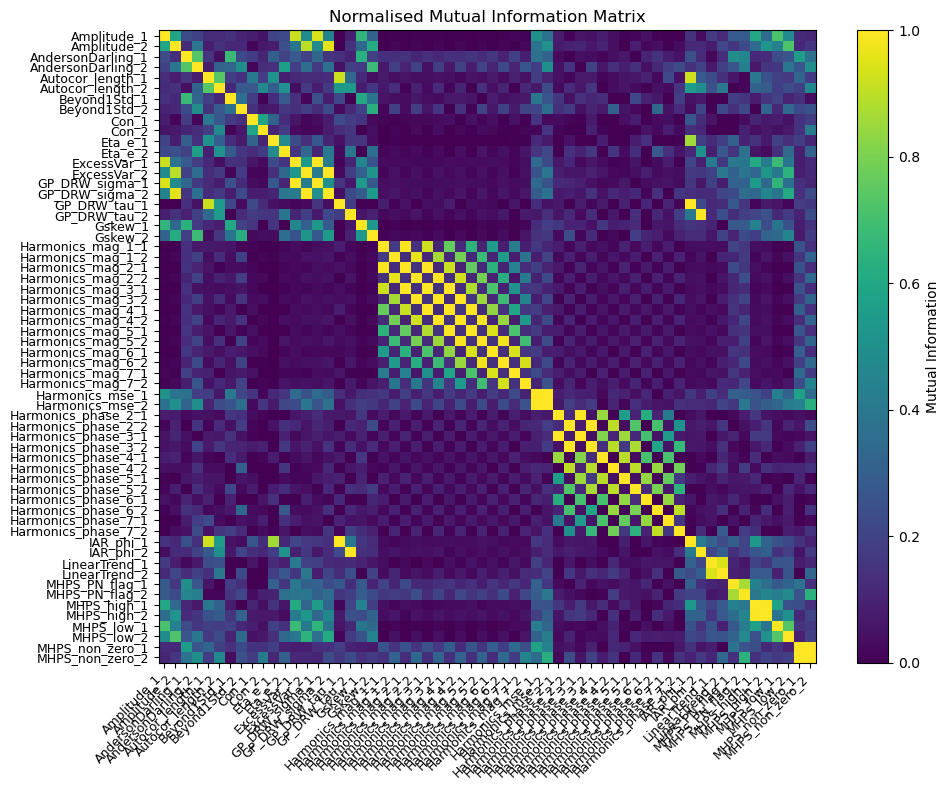

In [110]:
discrete = None
mi  = mutual_information_matrix(dftp.iloc[:, :60], discrete_cols=discrete)
nmi = normalised_mutual_information_matrix(mi)

plot_mi_matrix(nmi, title="Normalised Mutual Information Matrix")

# Data reduction

* Dimensionality reduction
* Numerosity reduction
* Data compression
* Changing the data representation

## Dimensionality reduction

Let's get the labels for our dataset so that we can visualize how well our variables are separated

In [111]:
labels = pd.read_pickle("data/dfcrossmatches_small.pickle")

In [112]:
labels

,classALeRCE,ra,dec,period,source,id_source,class_source,separation_arcsec
oid,,,,,,,,
ZTF18aaveffj,LPV,291.520423,21.930962,NaN,GAIADR2VS,2018953972876187648.0,MIRA_SR,0.067312
ZTF19aauyvnv,LPV,270.298238,-17.722810,NaN,GAIADR2VS,4143774487177066496.0,MIRA_SR,0.062104
ZTF18ablqvvc,RRL,271.180157,-6.556286,NaN,GAIADR2VS,4171403011041441792.0,RRAB,0.095138
ZTF19abiblfd,RRL,268.188213,-17.161156,NaN,GAIADR2VS,4144758786310249984.0,RRAB,0.043913
ZTF18acbvvku,AGN,48.110790,39.274936,NaN,MILLIQUAS,4C 39.11,A,0.055433
...,...,...,...,...,...,...,...,...
ZTF18aawgtde,QSO,235.612689,29.700747,NaN,MILLIQUAS,FBQS J1542+2942,Q,0.384536
ZTF18ablqnie,LPV,260.850159,-23.237702,NaN,GAIADR2VS,4111611813625888768.0,MIRA_SR,0.228594
ZTF19adcftsl,QSO,210.322714,22.715302,NaN,MILLIQUAS,LAMOSTJ140117.45+224255.2,Q,0.067727


In [113]:
labels = labels.loc[labels.index.isin(df.index)].classALeRCE

In [114]:
labels.unique()

array(['QSO', 'LPV', 'RRL', 'EB/EW', 'EA', 'YSO', 'SNII', 'RSCVn', 'AGN',
       'Blazar', 'CV/Nova', 'Periodic-Other', 'SNIa', 'NLQSO', 'Ceph',
       'SNIbc', 'DSCT', 'SNIIn'], dtype=object)

We will drop two labels that are not relevant based on domain knowledge

In [115]:
mask = labels.isin(['LPV', 'RRL', 'AGN', 'QSO', 'EB/EW', 'YSO', 'EA',
       'Blazar', 'RSCVn', 'DSCT', 'Ceph', 'SNIa', 'SLSN', 'CV/Nova',
       'SNII', 'Periodic-Other', 'SNIbc', 'SNIIn', 'SNIIb', 'TDE'])

In [116]:
dftp = dftp.loc[mask]
labels = labels.loc[dftp.index]

In [117]:
dftp.shape

(999, 179)

In [118]:
df.head()

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aakgayt,0.608093,0.530428,0.999978,0.999754,1.0,1.0,0.315789,0.210526,0.000000,0.0,...,9.0,38.0,34.0,15.0,0.357895,3.947368e-01,3.482189,3.815190,0.651429,1.000000
ZTF18abjbxku,1.919376,0.820454,1.000000,0.995996,4.0,3.0,0.558442,0.500000,0.053333,0.0,...,0.0,12.0,10.0,12.0,0.129870,6.666667e-01,9.257582,10.103082,0.825714,0.500000
ZTF19aaafpst,0.545609,0.402965,1.000000,1.000000,1.0,1.0,0.338235,0.442308,0.000000,0.0,...,1.0,1.0,29.0,19.0,0.426471,3.653846e-01,1.876731,3.325231,0.897857,0.994167
ZTF18acgmekk,0.073884,0.067873,0.917473,0.330160,1.0,1.0,0.363636,0.363636,0.000000,0.0,...,3.0,0.0,0.0,0.0,0.000000,-5.551115e-17,2.384932,4.297932,0.881429,0.986667
ZTF20acnvxgx,0.121103,0.108838,0.792119,0.999600,2.0,1.0,0.200000,0.142857,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,-5.551115e-17,5.071728,5.609728,0.910000,0.976625


In [119]:
labels[:5]

oid
ZTF18aakgayt    EB/EW
ZTF18abjbxku      LPV
ZTF19aaafpst      RRL
ZTF18acgmekk    EB/EW
ZTF20acnvxgx      LPV
Name: classALeRCE, dtype: object

<Axes: ylabel='classALeRCE'>

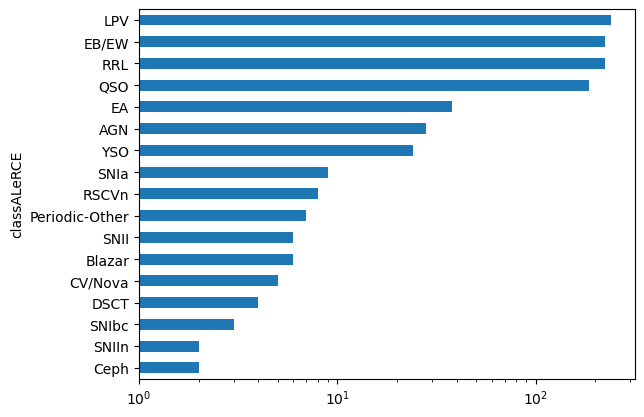

In [120]:
labels.value_counts().sort_values().plot.barh(log=True)

The data is highly imbalanced!

Let's encode the labels
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html

In [121]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(['SNIbc', 'SNII', 'SNIIn', 'SNIIb', 'SNIa', 'SLSN', 'TDE',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
# force given order
le.classes_ = np.array(['SNIbc', 'SNII', 'SNIIn', 'SNIIb', 'SNIa', 'SLSN', 'TDE',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
y = le.transform(labels)

In [122]:
le.inverse_transform([y[0]])

array(['EB/EW'], dtype='<U14')

We will try using PCA, t-SNe, UMAP and PACMAP

### PCA

In [123]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(dftp)
df_pca = pca.transform(dftp)

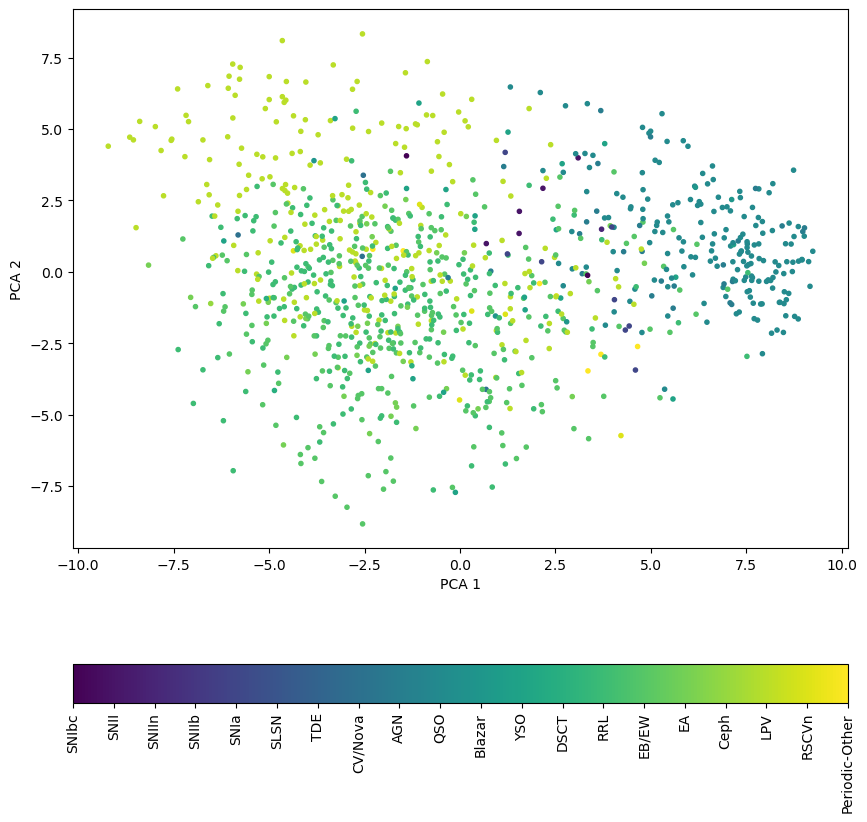

In [124]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_pca[:, 0], df_pca[:, 1], c=np.array(y), marker='.')
ax.set_xlabel("PCA 1")
ax.set_ylabel("PCA 2")
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90);

### t-SNE

In [125]:
from sklearn.manifold import TSNE

In [126]:
tsne_model = TSNE(n_components = 2, init = 'pca', perplexity = 25)
df_tsne = tsne_model.fit_transform(dftp[:10000])

/tmp/ipykernel_202046/245265200.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend();


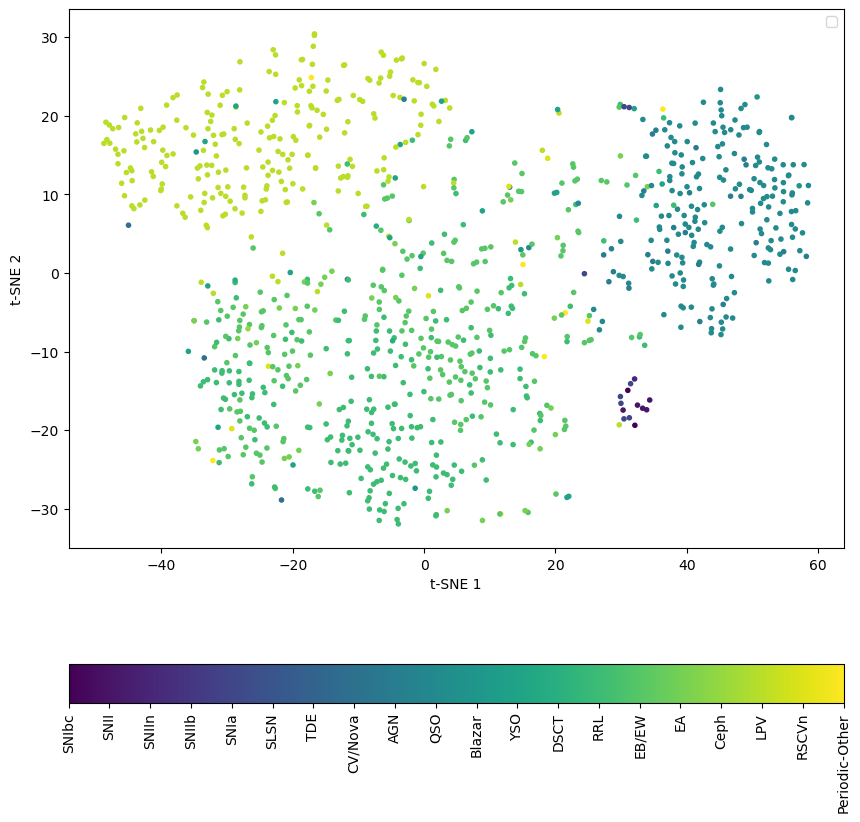

In [127]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_tsne[:, 0], df_tsne[:, 1], c=np.array(y[:10000]), marker='.')
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90);

### UMAP

In [128]:
import umap
reducer = umap.UMAP()

2026-03-24 15:44:00.450591: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-03-24 15:44:00.851535: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-03-24 15:44:02.330791: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [129]:
df_umap = reducer.fit_transform(dftp)

/tmp/ipykernel_202046/100125245.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend();


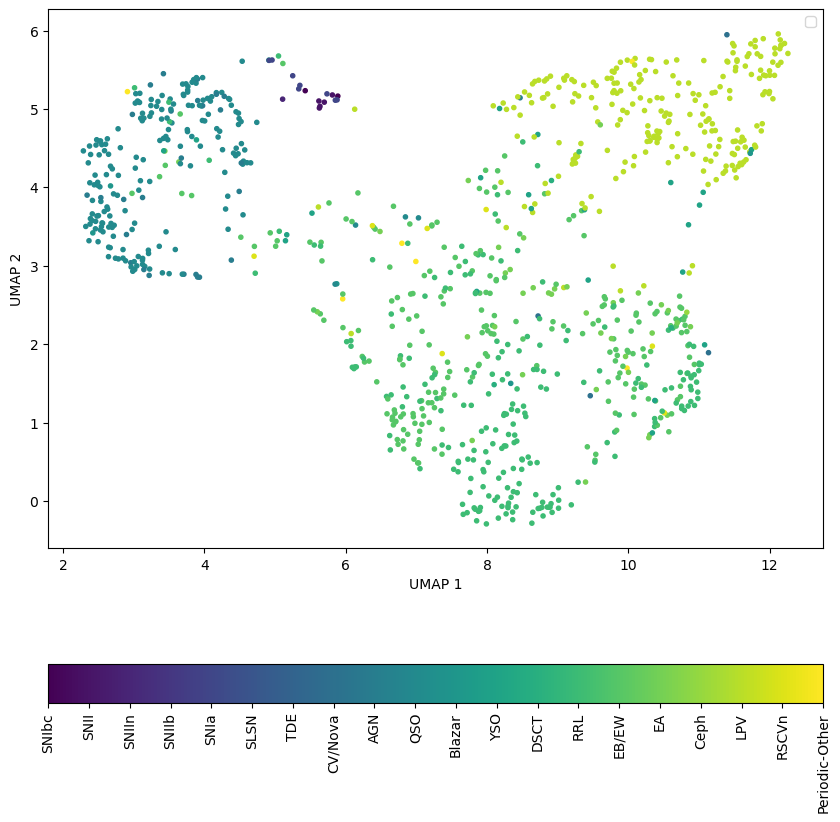

In [130]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_umap[:, 0], df_umap[:, 1], c=y, marker='.')
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90);

### PacMAP

In [131]:
import pacmap

In [132]:
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=4.0)
df_pacmap = embedding.fit_transform(dftp, init="pca")

/tmp/ipykernel_202046/3046764736.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend();


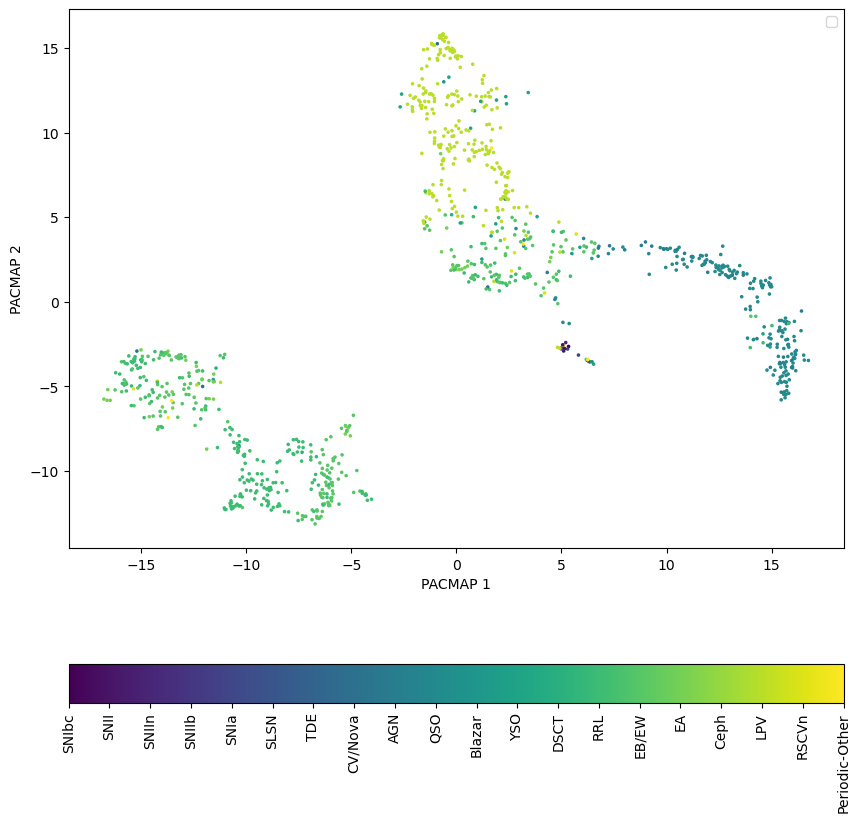

In [133]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_pacmap[:, 0], df_pacmap[:, 1], c=y, marker = ".", s=10)
ax.set_xlabel("PACMAP 1")
ax.set_ylabel("PACMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max() + 1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max() + 1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

## Compute feature importance using random forest classifier

In [134]:
from imblearn.ensemble import BalancedRandomForestClassifier

In [137]:
? BalancedRandomForestClassifier

Init signature:
 BalancedRandomForestClassifier(
    n_estimators=100,
    *,
    criterion='gini',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=False,
    oob_score=False,
    sampling_strategy='all',
    replacement=True,
    n_jobs=None,
    random_state=None,
    verbose=0,
    warm_start=False,
    class_weight=None,
    ccp_alpha=0.0,
    max_samples=None,
    monotonic_cst=None,
)
Docstring:     
A balanced random forest classifier.

A balanced random forest differs from a classical random forest by the
fact that it will draw a bootstrap sample from the minority class and
sample with replacement the same number of samples from the majority
class.

Read more in the :ref:`User Guide <forest>`.

.. versionadded:: 0.4

Parameters
----------
n_estimators : int, default=100
    The number of trees in the forest.

criterion : {"gini", 

In [138]:
forest = BalancedRandomForestClassifier(n_estimators=500)
forest.fit(dftp, labels)

BalancedRandomForestClassifier(n_estimators=500)

<Axes: >

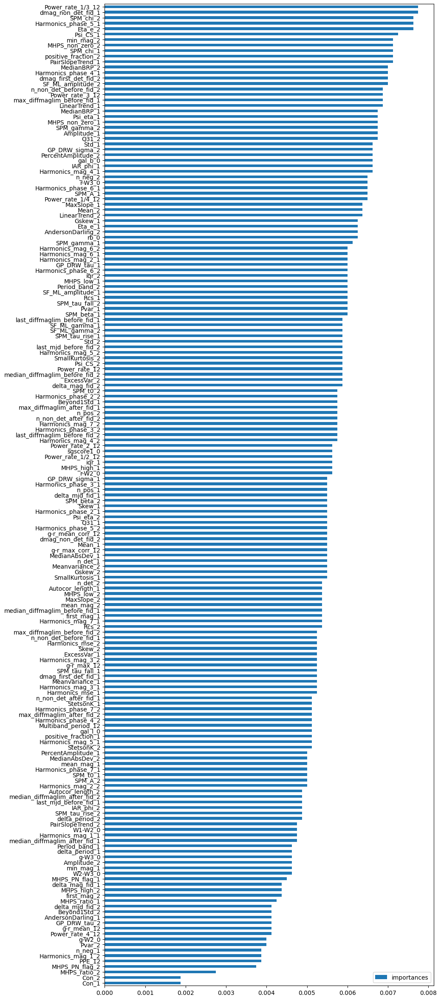

In [139]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
imps = pd.DataFrame.from_dict({"importances": importances})
imps.index = list(dftp)
imps.sort_values(by="importances").plot.barh(figsize=(10, 30))

Note that the order of correlated variables may be degenerate between variables.

# Summary

* Automatic EDA
* Basic statistics
* Missing data imputation
* Normality tests and data transformation
* Correlations and variable clustering
* Dimensionality reduction
* Class distribution if labels exist
* A lot more can be done!

Some comments:

* if you are imputing data, it would be better to impute it after doing any transformations. In that way the correlations will be more useful.
* also, if you are working in a supervised setting, learn transformations based on the training set alone. Otherwise there could be some information leakege. 